# 2020.06.27_furyroad_with_minibatches
----

* adding minibatch support to all the furyroad and online operators
* tested the gamma corpus
* tested chaining the corpii


### Version Info
* madmax:  `cbec8b5` `ef1030e` `afcf5bd`
* research: `6256367` `5535b69` `de42a45`


### Baselines to date 

#### OnlineRNN_83dc74824
This is from `2020.06.12_furyroad.ipynb`  and contains some pretty good 30min and 1day baselines

#### FuryRoad_7da46069e
This is from `2020.06.18_corpus_colossus.ipynb` and contains a decent OnlineBooster  (what was then called FuryRoad) baselines


#### Clossus_06cb73372
No emas but with AR in Alepah (bilinear with bias) (follows Colossus_f4aa826d6)

---
## History

#### 2020.06.19_starting_furyroad

* Initial research with furyroad (corpus colossus)
* I renanmed furyroad to be OnlineBooster and renamed the CorpusColussus package as furyroad


#### 2020.06.18_corpus_colossus ( no progress here)

* Was fooling around with  corpus colossus idea but renamed that whole idea to be furyroad
* Generated some interesting baselines


#### 2020.06.12_furyroad

* Testing disjoint 1 day returns as prediction targets
* sequential boosting with furyroad


#### 2020.06.10_refactored_rnns
refactored the rnns to support single step updates. Will test these

#### 2020.06.08_baselines_again
Since I am a total fucking retard and I delete all important shit - I'm going to waste anotehr day regenerating this fucking shit

Recap of all models to date
*   basic online model with rolling window (no technical features)
*  disjoint returns
*   online learning with Q and P-omega weights
* boosting / sequential residualization


#### 2020.06.04_recap
Recap of all models to date
*   basic online model with rolling window (no technical features)
*  disjoint returns
*   online learning with Q and P-omega weights
* boosting / sequential residualization



In [1]:
# preamble
%alias_magic  nbagg matplotlib -p nbagg
%alias_magic  inline matplotlib -p inline
%load_ext memory_profiler
%load_ext line_profiler

from pylab import *
from madmax.api import *
mx = mx.reload()
mxtr = mxtr.reload()
plt.style.use('seaborn-whitegrid')

###################################################################
# Interactive configuration
# When running a config grid this will throw a FrozenException
# and the grid Config will be used
###################################################################
try:
    Config = mx.Configuration(
        name = 'etf_technical/2020.06.27_furyroad_with_minibatches/',
        mode = 'interactive',
        hps = mx.HPSet(
            start='20070101',
            end='20200501',
            INTS_PER_DAY = 13,                
        ),
        code = '2020.06.27_furyroad_with_minibatches.ipynb',
        tb_port=6006,
    )
    disp('Running interactive configuration ', h=2)
except mx.Configuration.FrozenException:
    if Config.mode != 'grid':
        raise RuntimeError('An unexpected configruation encountered')
    disp('Running a grid configuration ', h=2)

device = 'cuda'
dtype = tr.float32
Config.start()



# to run run a grid of hyperparameters ...
####################################
# # hyperparameters
# mx.Config.hps = fr.HPSet(
# )
# mx.Config.code = ''
# # configs = []
# # for obs_weight in ['no_weight', 'dollar_weight', 'log_weight']:
# #     cfg = fr.Config.clone()
# #     cf
# #     cfg.hps = cfg.hps.clone( obs_weight=obs_weight )
# #     cfg.freeze()
# #     display_html( cfg )
# #     configs.append( cfg )
# # notebook = fr.Config.run_grid( configs, outfile=fr.Config.uri+'/../cadre_price_index.20200302 - weight_grid_results.ipynb', n_jobs=None )

Created `%nbagg` as an alias for `%matplotlib nbagg`.
Created `%inline` as an alias for `%matplotlib inline`.


<IPython.core.display.Javascript object>

<h1> Config etf_technical/2020.06.27_furyroad_with_minibatches/ </h1>
<b> hash</b>: none </h4>
<b> mode </b>: interactive
<b> frozen </b>: False
<b> uri </b>: /home/fj/experiments/etf_technical/2020.06.27_furyroad_with_minibatches/none
<b> tb_port </b>: 6006
<h3> Hyperparameters </h3>
HPSet(
		INTS_PER_DAY=13,
		end='20200501',
		start='20070101',
	)<h3> Code </h3>
<b> format </b>: .ipynb
<b> code </b> : /local/cloud/code/research/etf_technical/2020.06.27_furyroad_with_minibatches.ipynb

## interactive global hyperparameters

In [2]:
# global  configruation
#######
if Config.mode == 'grid':
    raise Config.FrozenException( 'running grid configruation - skipping')

hps = Config.hps

hps.universe = mx.HPSet(
    start = '20100101',
    end='20200401',
    min_count=2000,
    min_dollar_vol=1e5
)


hps.feature_set = mx.HPSet(
    unadj_prices=[
        'open_unadj_30min', 'high_unadj_30min', 'low_unadj_30min', 'close_unadj_30min', 'mid_unadj_30min',
        'log_open_unadj_30min', 'log_close_unadj_30min',
    ],
    adj_prices=[
        'open_adj_30min', 'high_adj_30min', 'low_adj_30min', 'close_adj_30min',
        'mid_adj_30min', 'mid_adj_0D.12h.vwap', 'mid_adj_2D.12h.vwap', 'mid_adj_5D.vwap',
        'open_adj_0D.12h', 'high_adj_0D.12h', 'low_adj_0D.12h',
        'open_adj_2D.12h', 'high_adj_2D.12h', 'low_adj_2D.12h',
        'open_adj_5D', 'high_adj_5D', 'low_adj_5D',
    ],
    rel_prices=[
        'rel_price_260', 'rel_price_780', 'rel_price_3276',
    ],
    volumes=[
        'volume_unadj_30min', 'dollar_volume_unadj_30min', 'avg_dollar_volume',
    ],
    log_volumes=[
        'log10_dollar_volume_30min', 'log10_dollar_volume_30min_resid',
    ],
    rel_volume=[
        'rel_dollar_volume_260', 'rel_dollar_volume_780',
        'rel_dollar_volume_3276',
    ],
    calendar=[
        'timeofday', 'cos1_timeofday', 'cos2_timeofday', 'cos4_timeofday',
        'dayofweek', 'cos1_dayofweek', 'cos2_dayofweek',
        'weekofmonth', 'cos1_weekofmonth', 'cos2_weekofmonth',
        'monthofquarter', 'cos1_monthofquarter', 'cos2_monthofquarter',
        'quarterofyear', 'cos1_quarterofyear', 'cos2_quarterofyear',
    ],
    lagging=[
        'lagrtn_adj_30min', 'lagrtn_adj_1hr', 'lagrtn_adj_1day',
        'lagrtn_adj_30min_resid',
    ],
    mkt=[
        'mkt_lagrtn_30min',
        'mkt_lagrtn_30min_260.rw_sd', 'mkt_lagrtn_30min_780.rw_sd', 'mkt_lagrtn_30min_3276.rw_sd',
    ],
    vol=[
        'lagrtn_adj_30min_260.rw_sd', 'lagrtn_adj_30min_780.rw_sd', 'lagrtn_adj_30min_3276.rw_sd',
        'lagrtn_adj_30min_resid_260.rw_sd', 'lagrtn_adj_30min_resid_780.rw_sd', 'lagrtn_adj_30min_resid_3276.rw_sd',
    ],
    zscores=[
        'lagrtn_adj_30min_260.rw_zscore', 'lagrtn_adj_30min_780.rw_zscore', 'lagrtn_adj_30min_3276.rw_zscore',
        'lagrtn_adj_30min_resid_260.rw_zscore', 'lagrtn_adj_30min_resid_780.rw_zscore',
        'lagrtn_adj_30min_resid_3276.rw_zscore',
    ],
    betas=[
        'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min_2340.ew_beta',
        'lagrtn_adj_30min_3276.ew_beta', 'lagrtn_adj_30min_6500.ew_beta',
    ],
    afacs=[ 'bw_afac_30min', 'fw_afac_30min' ],
    technical=[
        'true_range_30min', 'true_range_0D.12h', 'true_range_2D.12h', 'true_range_5D',
        'direction_30min', 'direction_0D.12h', 'direction_2D.12h', 'direction_5D',
        'delta_rtn_30min', 'delta_rtn_0D.12h', 'delta_rtn_2D.12h', 'delta_rtn_5D',
        'ttp_high_adj_0D.12h', 'ttp_high_adj_2D.12h', 'ttp_high_adj_5D',
        'ttp_low_adj_0D.12h', 'ttp_low_adj_2D.12h', 'ttp_low_adj_5D',    
    ],    
    # features in teh daily dataset
    unadj_prices_daily=['open_unadj_30min_13.rw_mean'],
    lagging_daily=['lagrtn_adj_1day', 'lagrtn_adj_30min_resid_13.rw_mean',],
    mkt_daily=[ 'mkt_lagrtn_1day',  'mkt_lagrtn_30min_260.rw_sd', 'mkt_lagrtn_30min_780.rw_sd', 'mkt_lagrtn_30min_3276.rw_sd',],
    volumes_daily=['volume_unadj_30min_13.rw_mean', 'dollar_volume_unadj_30min_13.rw_mean', ],
    log_volumes_daily=[ 'log10_dollar_volume_30min_13.rw_mean', 'log10_dollar_volume_30min_resid_13.rw_mean'],
    afacs_daily=[ 'bw_afac_30min_13.rw_mean', 'fw_afac_30min_13.rw_mean', ],
)

hps.leading_rtns = [
    'leadrtn_adj_30min', 'leadrtn_adj_1hr', 'leadrtn_adj_1day',
    'mkt_leadrtn_30min', 'mkt_leadrtn_1day',
    'leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2', 'leadrtn_adj_30min_disjoint.3',
]

hps.leading_rtns_daily = [
  'leadrtn_adj_1day', 'mkt_leadrtn_1day', 'leadrtn_adj_1day_disjoint_30min', 
]

hps.weights = ['valid_30min', 'weight', ]  


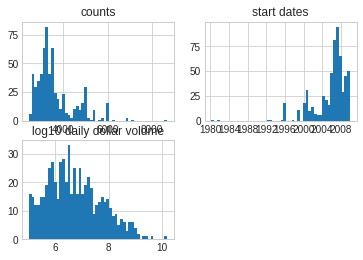

In [3]:
# identify the universe of ETFS
#############################################################
%inline
from research.etf_technical import etf_data_apr2020 as etfd; reload( etfd )

etf_stats = etfd.compute_etf_stats()
etf_stats = etf_stats[etf_stats.vendor=='kibot']
orig_len = len( etf_stats )
# drop etfs without enough history
etf_stats = etf_stats[(etf_stats['start'] <= hps.universe.start ) 
                      & (etf_stats['end'] > hps.universe.end ) 
                      & (etf_stats['n'] >= hps.universe.min_count)
                      & (etf_stats['daily_dollar_volume_adj'] >= hps.universe.min_dollar_vol ) ]

disp( 'after filtering', len( etf_stats ), 'symbols out of original ' ,orig_len )

etf_stats = (etf_stats
             .merge( etfd.all_etfs, how='left', left_on='symbol', right_on='Symbol' )
             .drop( columns=['Symbol', 'ETP Name', 'Leveraged / Inverse' ])
             .rename( columns={'Asset Class':'asset_class', 'Description':'name'} )
             .fillna( 'Not Specified')             
             .set_index('symbol')
            )
disp( etf_stats.groupby('asset_class').name.count() )

ax = subplot( 2,2, 1 )
etf_stats.n.hist(ax=ax, bins=50)
ax.set_title( 'counts')

ax = subplot( 2,2, 2 )
etf_stats.start.hist(ax=ax, bins=50)
ax.set_title( 'start dates')

ax = subplot( 2,2, 3 )
etf_stats.daily_dollar_volume_adj.log10().hist(ax=ax, bins=50)
ax.set_title( 'log10 daily dollar volume')

# this is the universe we will work with. 
# HERO has a massive returns spike in 2015.11.09 - which throws off residualization quite a bit.
hps.universe.symbols = sorted( etf_stats.index.values )


In [4]:
# build up the data and features
#############################################
%inline
from research.etf_technical import etf_data_apr2020 as etfd; reload( etfd )
from research.etf_technical import etf_technical_20200517 as etfrc; reload( etfrc )

# fetch the data as a dataarray
builder = etfd.BuildDataWithAfacs( symbols=hps.universe.symbols, mkt_only=True, start=hps.start ,).set( memoize=True )
builder.data = None
disp( 'builder BuildDataWithAfacs_7f79ef4bf  expected got', builder.hash() )
da = builder(  )
df = builder.output_meta

# hyperparams related to computing returns and residuals
hps.returns_hps = mx.HPSet(    
    price_windows=[ 24*1, 24*5, 24*10],
    beta_halflifes=[13 * 90, 13 * 180, 13 * 252, 13*500],
    dollar_volume_window=13*180,
    ema_halflifes=[20 * 13, 60 * 13, 252 * 13],
    resid_halflife=13,
    
)
# compute log-returns, log-dollar-volume, betas, residual returns and clean up the data
rtn_computer = etfrc.compute_returns_and_betas( 
    start=hps.start, end=None,     
    dollar_volume_window=hps.returns_hps.dollar_volume_window, 
    price_windows = hps.returns_hps.price_windows,
    beta_halflifes=hps.returns_hps.beta_halflifes, 
    resid_halflife=None,    
) 
rtn_computer.data = builder
disp( 'expected compute_returns_and_betas_ea966833a got', rtn_computer.hash(), h=4, color='teal' )

# add relative price and relative volume features
rel_price_and_vols = etfrc.add_relative_price_and_volumes( emas=hps.returns_hps.ema_halflifes )
rel_price_and_vols.data = rtn_computer
disp( 'expected add_relative_price_and_volumes_a65da371a got', rel_price_and_vols.hash(), h=4, color='teal' )

# add volatility and calendar features
add_vols = etfrc.add_volatilities( emas=hps.returns_hps.ema_halflifes )
add_vols.data = rel_price_and_vols
disp( 'expected add_volatilities_77ca914f0 got', add_vols.hash(), h=4, color='teal' )

# add disjoint returns
disjoint_returns= etfrc.add_dijoint_returns( lags=(1, 2, 3) )
disjoint_returns.data = add_vols
disjoint_returns.features = ['leadrtn_adj_30min', 'leadrtn_adj_1hr', 'leadrtn_adj_1day', 'lagrtn_adj_30min' ]
disp( 'expected add_dijoint_returns_361e1f0b0 got', disjoint_returns.hash(), h=4, color='teal' )
da = disjoint_returns(   )


# build daily data
daily_data = etfrc.build_daily_data( timeofday=dt.time(16,) ).set(memoize=True)
daily_data.data = disjoint_returns
daily_data.features = ['volume_unadj_30min', 'dollar_volume_unadj_30min', 'lagrtn_adj_30min_resid', 'bw_afac_30min', 'fw_afac_30min', 'open_unadj_30min',  
                       'log10_dollar_volume_30min', 'log10_dollar_volume_30min_resid' ]
disp( 'expected build_daily_data_46a83a0b7 got', daily_data.hash(), h=4, color='teal' )
dda = daily_data()

#  OnlineRNN_16fb41e6b 
## Regenerating an OnlineRNN_cab8874c9 after refactoring for minibatch support (follows Clossus_06cb73372)
### Uses `weight`, and zcores the target returns

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_1day,NaN,1688976,0.987010,-0.000064,0.770590,0.007843,0.000062,10.145668,2.512977,0.835968,0.836916,0.793556
leadrtn_adj_1day_disjoint_30min,NaN,1688976,0.986698,-0.000064,0.578354,0.005298,0.000028,6.770386,1.452829,0.835968,0.836916,0.793556


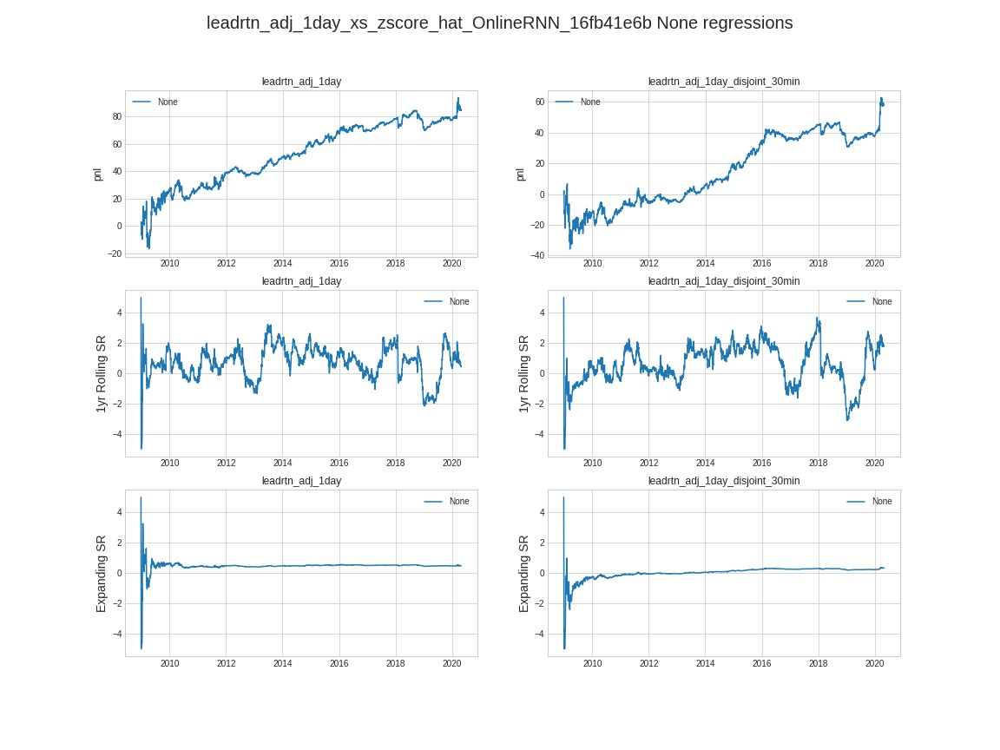

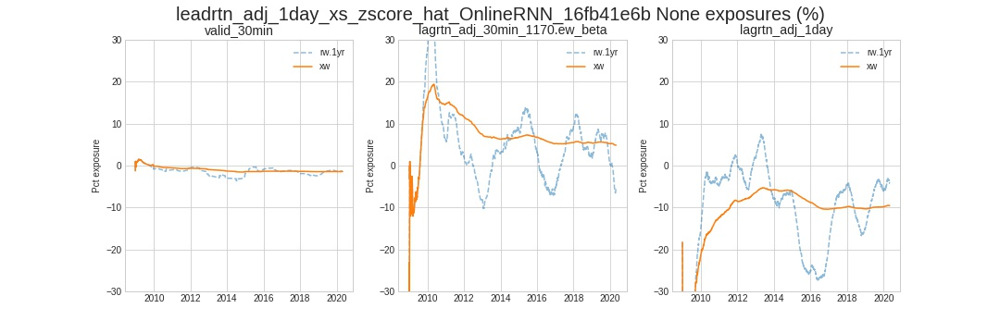

/home/fj/cloud/code/madmax/utils/stats.py:72: RuntimeWarning: invalid value encountered in float_scalars
  return autocov / var
/home/fj/cloud/code/madmax/utils/stats.py:72: RuntimeWarning: invalid value encountered in float_scalars
  return autocov / var
/home/fj/cloud/code/madmax/utils/stats.py:72: RuntimeWarning: invalid value encountered in float_scalars
  return autocov / var
/home/fj/cloud/code/madmax/utils/stats.py:72: RuntimeWarning: invalid value encountered in float_scalars
  return autocov / var


,0
leadrtn_adj_1day_xs_zscore_hat_OnlineRNN_16fb41e6b,fcst_0
leadrtn_adj_1day_xs_zscore_hat_OnlineRNN_cab8874c9,fcst_1


,fcst_1,fcst_0
fcst_1,1.0,1.0
fcst_0,1.0,1.0


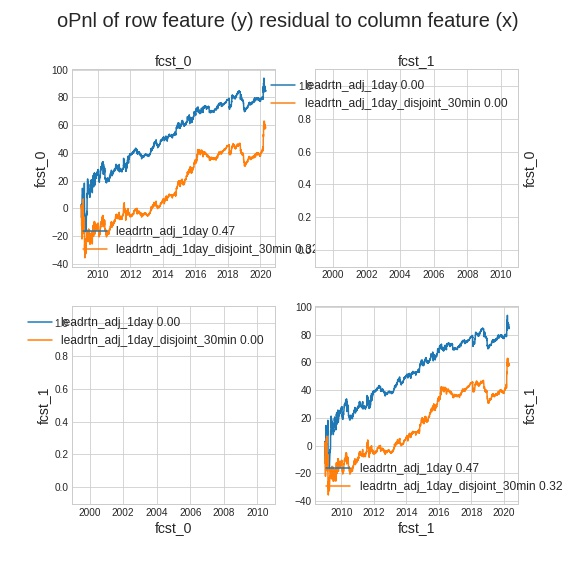

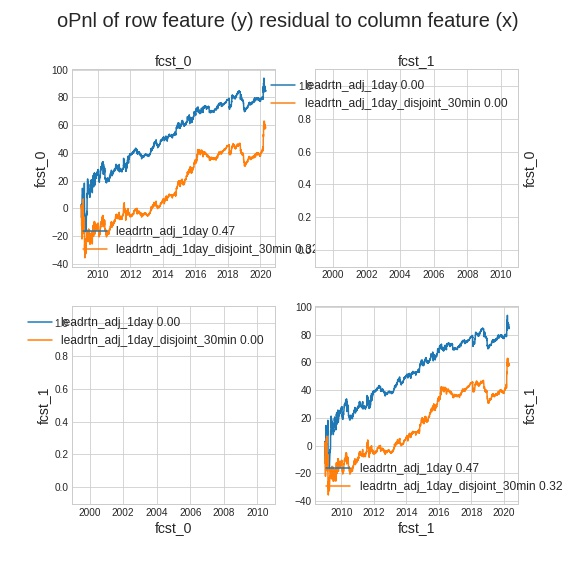

In [5]:
#  OnlineRNN_16fb41e6b 
####################################################################################
%inline

BASELINE_NAME = 'OnlineRNN_16fb41e6b'
PREV_BASELINE = 'Colossus_06cb73372'
BASELINE_NOTES = 'Regenerating an OnlineRNN_cab8874c9 after refactoring for minibatch support'
if PREV_BASELINE and BASELINE_NOTES:
    BASELINE_NOTES += f' (follows {PREV_BASELINE}) '
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# set the input data
data = daily_data 

phps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end,  #
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=True, #zscore returns
        winsorize_target=False, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
        winsorize_weight=None, #winsorizes the learning weight (not the regression weight)
    ),        
    # hps related to profiling
    profiling=mx.HPSet(
        xsw=False,
        xsz=False,
        clip=None,
        exposures=(
            ['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_1day']         
        ),
        targets=['leadrtn_adj_1day', 'leadrtn_adj_1day_disjoint_30min' ],
        weight='weight',
        
    ),
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min_13.rw_mean', 'log_open_unadj_30min', 'open_unadj_30min' ]
        + hps.feature_set.lagging_daily
        + hps.feature_set.vol
        + hps.feature_set.log_volumes_daily
        # + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.betas
        # + hps.feature_set.technical
        # + hps.feature_set.afacs                
    ) ),
    lookahead=2, #global lookahead
    targets=(
        []
        +['leadrtn_adj_1day'] 
    ),
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    weight='weight',
    pre_transformer=mx.HPSet( winsorize=0.05, pre_normalize=mx.HPSet( halflife='xw', clip=3 ), subset=False, hydra=False, transform='quadratic',  
                              post_normalize=mx.HPSet( halflife=None, clip=3), ema_halflifes=[13 * 5, 13 * 20, 13 * 40], ),
    post_transformer=mx.HPSet( winsorize=0.05, pre_normalize=mx.HPSet( halflife=None, clip=3 ) ),
    batch_size=1000,  
    # ensembler hps
    ensembler=mx.HPSet(        
        ridge=1e-3,
        hl_1=None,
        hl_2=None,
        halflife_polyak=10,
        lr=1e-4,
        kappa=5,  # variance penalty
        halflife_kappa=20, # halflife for vraiance
        tv=None, #{1:1e-3, 2:1e-3, 13:1e-5},
        ortho=1,
        ortho_hl=13,        
        algo='eg',
        loss='l2',
        halflife_algo=None,
        use_omega=None,
        omega_lr=1,
        omega_ridge=None,
        omega_shift=0.01,
        pre_transformer=None,
        post_transformer=None,
    ),
    # the boosters
    boosters=[],    
)

booster_proto = mx.HPSet(        
    ridge=1e-6,
    hl_1=None,
    hl_2=None,
    halflife_polyak=10,
    kappa=1e-1,  # variance penalty
    halflife_kappa=20, # halflife for vraiance
    tv=None, #{1:1e-3, 2:1e-3, 13:1e-5},
    ortho=4,
    ortho_hl=13,        
    lr=1e-5,
    algo='gd',
    loss='l2',
    halflife_algo=None,
    use_omega=False,
    omega_lr=1,
    omega_ridge=None,
    omega_shift=0.01,
    pre_transformer=mx.HPSet( winsorize=0.05, pre_normalize=mx.HPSet( halflife=100, clip=3 ), subset=False, hydra=False, transform='quadratic',  
                              post_normalize=mx.HPSet( halflife=None, clip=3), ema_halflifes=[13 * 5, 13 * 20, 13 * 40], ),
    post_transformer=mx.HPSet( winsorize=0.05, pre_normalize=mx.HPSet( halflife=None, clip=3 ) ),
)
phps.ensembler = booster_proto

# booster_versions = [
#     dict( kappa=3, lr=1e-5 ),
#     dict( kappa=2, lr=1e-6 ),
#     dict( kappa=4, lr=1e-6 ),
# #     dict( use_omega='P', kappa=3, omega_lr=1, lr=1e-4 ),
# #     dict( use_omega='P', kappa=2, omega_lr=1, lr=1e-4 ),
# #     dict( use_omega='P', kappa=4, omega_lr=1, lr=1e-4 ),
# ]
# for bv in booster_versions:
#     phps.boosters.append( booster_proto.clone( **bv ) )

from research.etf_technical import online_booster_runner as obr; reload( obr )

# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline.hps == phps, 'failure to valdiate hyperparams'
        disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = obr.run_pipeline( data, prev_baseline=PREV_BASELINE, hps=phps, memoize=True )
    disp( f'Expected {BASELINE_NAME}  got ', runner.name, h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        # let's give this fucker a name
        if not BASELINE_NAME: 
            BASELINE_NAME = runner.name 
        baseline = mx.Baseline.make( runner, hps=phps, notebook=Config.code,  notes=BASELINE_NOTES,  name=BASELINE_NAME   )
        disp( 'Baselined ', BASELINE_NAME, h=2, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( 'Regressions', reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )
    
# compare this with other forecasts in the same dataarray if needed ...
comparator = mx.ForecastComparator( targets=phps.profiling.targets, weight=phps.profiling.weight, winlen=100 )
_ = comparator.compare( baseline, forecasts=[baseline.output_features[-1],  'leadrtn_adj_1day_xs_zscore_hat_OnlineRNN_cab8874c9'] )

# Colossus_d17cf1e84 
## Redoing Clossus_06cb73372 with minibatch=1 (bilinear model with AR in Alpha, no emas)  (follows OnlineRNN_16fb41e6b) 

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_1day,NaN,1688976,0.918845,633.157872,0.942678,0.008415,0.000071,10.492479,2.155723,0.239412,0.248454,0.227644
leadrtn_adj_1day_disjoint_30min,NaN,1688976,0.918515,633.157872,0.796847,0.006862,0.000047,8.546585,1.729412,0.239412,0.248454,0.227644


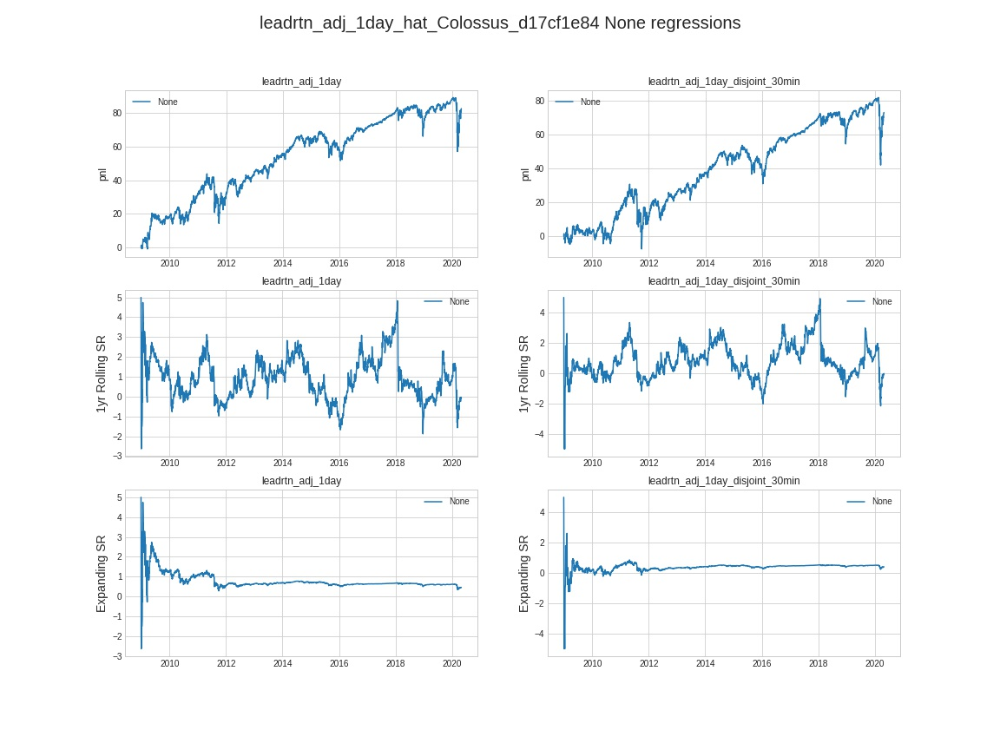

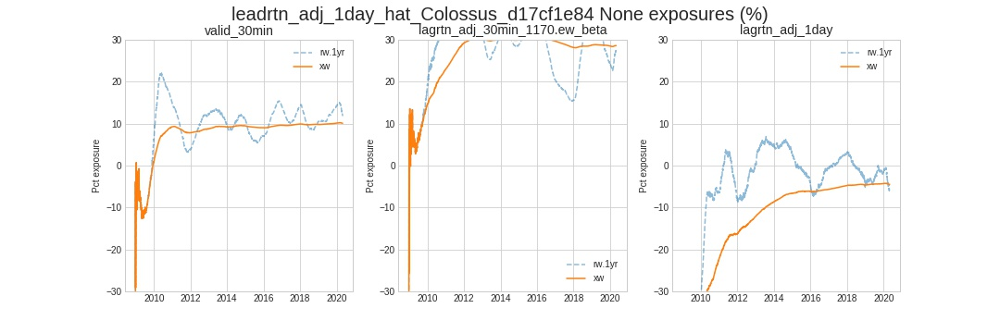

CacheNotFoundError: could not find output in any memoization cache

In [6]:
# Colossus_d17cf1e84 
############################################################################
BASELINE_NAME = 'Colossus_d17cf1e84'
PREV_BASELINE = 'OnlineRNN_16fb41e6b'
BASELINE_NOTES = 'Redoing Clossus_06cb73372 with minibatch=1 (bilinear model with AR in Alpha, no emas) '
if PREV_BASELINE and BASELINE_NOTES:
    BASELINE_NOTES += f' (follows {PREV_BASELINE}) '
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# set the input data
INTS_PER_DAY = 1
data = daily_data 

phps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end,  #
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=None, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
        winsorize_weight=None, #winsorizes the learning weight (not the regression weight)
        winsorize_orthos=None,
        normalize_orthos=True,
    ),        
    # hps related to profiling
    profiling=mx.HPSet(
        xsw=False,
        xsz=False,
        clip=None,
        exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_1day'],
        targets=['leadrtn_adj_1day', 'leadrtn_adj_1day_disjoint_30min' ],
        weight='valid_30min',
        
    ),
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min_13.rw_mean', 'log_open_unadj_30min', 'open_unadj_30min' ]
        + hps.feature_set.lagging_daily
        + hps.feature_set.vol
        + hps.feature_set.log_volumes_daily
        # + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.betas
        # + hps.feature_set.technical
        # + hps.feature_set.afacs                
    ) ),
    lookahead=2, #global lookahead
    targets=(
        []
        +['leadrtn_adj_1day'] 
    ),
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    weight='valid_30min',    
    colossus=mx.HPSet(
        minibatch=1,
        batch_size=2000,
        burn_in=2000,
        alphas=[],
        boost=1e-1,
        loss='psr',
        kappa=2,
        halflife_kappa=20,
        tv=1,
        ortho=1,
        omega=None,        
        gamma=None,
        theta=None,
        furiosa=None,
        alpha_transformer=mx.HPSet( winsorize=0.05, pre_normalize=mx.HPSet( halflife='xw', clip=3 ), subset=False, hydra=False, transform=None,  
                                    ema_halflifes=[], #5*INTS_PER_DAY, 20*INTS_PER_DAY], #, 40*INTS_PER_DAY, 60*INTS_PER_DAY,], 
                                    post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None),  ), 
        zeta_transformer=mx.HPSet( winsorize=0.01, post_normalize=False), #mx.HPSet( halflife=None, clip=3) ), 
        priming=100,        
    )
)


alpha_proto = mx.HPSet( 
    ar=10,
    ridge=1e-6,
    halflife_polyak=30,
    H=1,
    lr=1e-6,
    mode='bilinear',
    use_bias=True,
    rank=None,
    transformer=None,
)
phps.colossus.alphas = alpha_proto

import madmax.furyroad as mxf
from research.etf_technical import colossus_runner as recr
mxf = mxf.reload()
mxtr = mxtr.reload()
reload( recr )

# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline.hps == phps, 'failure to valdiate hyperparams'
        disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = recr.run_pipeline( data, hps=phps,  prev_baseline=PREV_BASELINE, memoize=True )
    disp( f'Expected {BASELINE_NAME}  got ', runner.name, h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        # let's give this fucker a name
        if not BASELINE_NAME: 
            BASELINE_NAME = runner.name 
        baseline = mx.Baseline.make( runner, hps=phps, notebook=Config.code,  notes=BASELINE_NOTES,  name=BASELINE_NAME   )
        disp( 'Baselined ', BASELINE_NAME, h=2, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    
    
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( 'Regressions', reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )

# compare this with other forecasts in the same dataarray if needed ...
comparator = mx.ForecastComparator( targets=phps.profiling.targets, weight=phps.profiling.weight, winlen=100 )
_ = comparator.compare( baseline, forecasts=baseline.output_features[-5:] )



# Colossus_340371d53
## trying minibatch = 20  (follows Colossus_d17cf1e84) 

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_1day,NaN,1688976,0.918845,445.377338,1.070645,0.015852,0.000251,19.745520,2.587195,0.906451,0.906467,0.897054
leadrtn_adj_1day_disjoint_30min,NaN,1688976,0.918515,445.377338,0.844878,0.010714,0.000115,13.348939,1.681386,0.906451,0.906467,0.897054


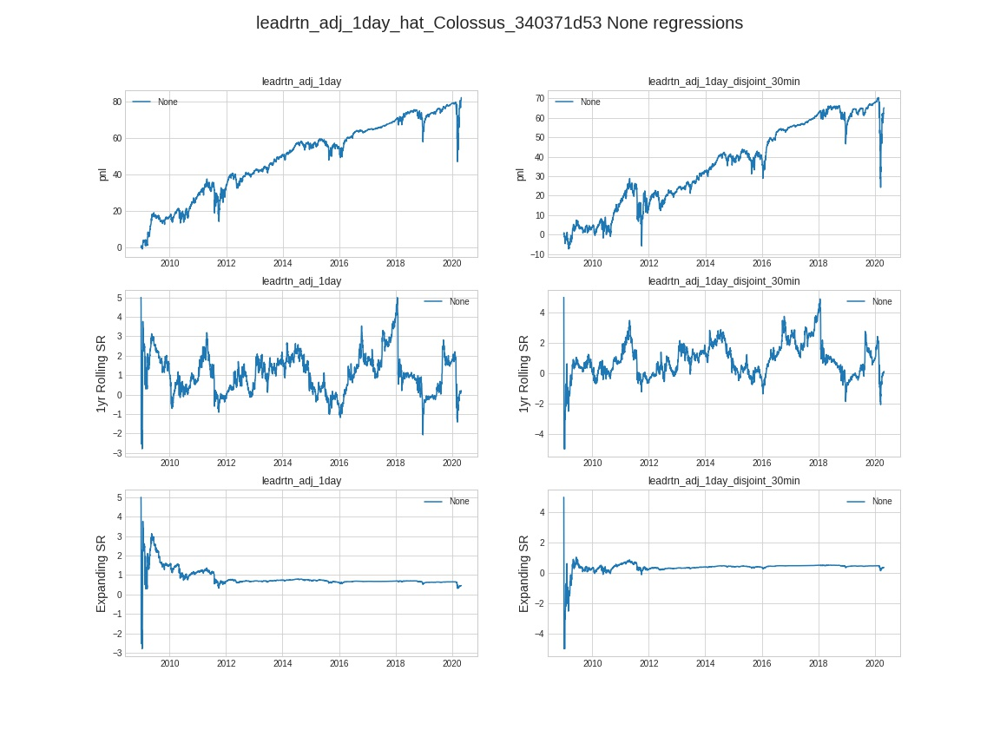

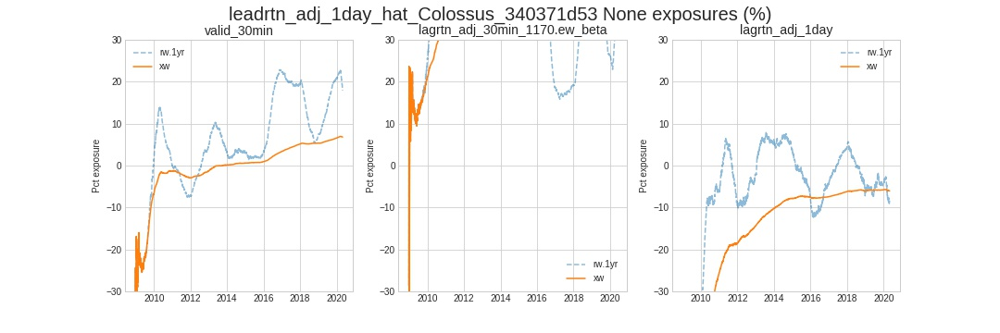

,0
leadrtn_adj_1day_hat_Colossus_f4aa826d6,fcst_0
leadrtn_adj_1day_hat_Colossus_06cb73372,fcst_1
leadrtn_adj_1day_xs_zscore_hat_OnlineRNN_16fb41e6b,fcst_2
leadrtn_adj_1day_hat_Colossus_d17cf1e84,fcst_3
leadrtn_adj_1day_hat_Colossus_340371d53,fcst_4


,fcst_0,fcst_1,fcst_2,fcst_3,fcst_4
fcst_0,1.000000,0.957959,0.273676,0.831278,0.849334
fcst_1,0.957960,1.000000,0.281382,0.825014,0.815113
fcst_2,0.273676,0.281382,1.000000,0.276364,0.237559
fcst_3,0.831278,0.825014,0.276364,1.000000,0.863696
fcst_4,0.849334,0.815113,0.237559,0.863696,1.000000


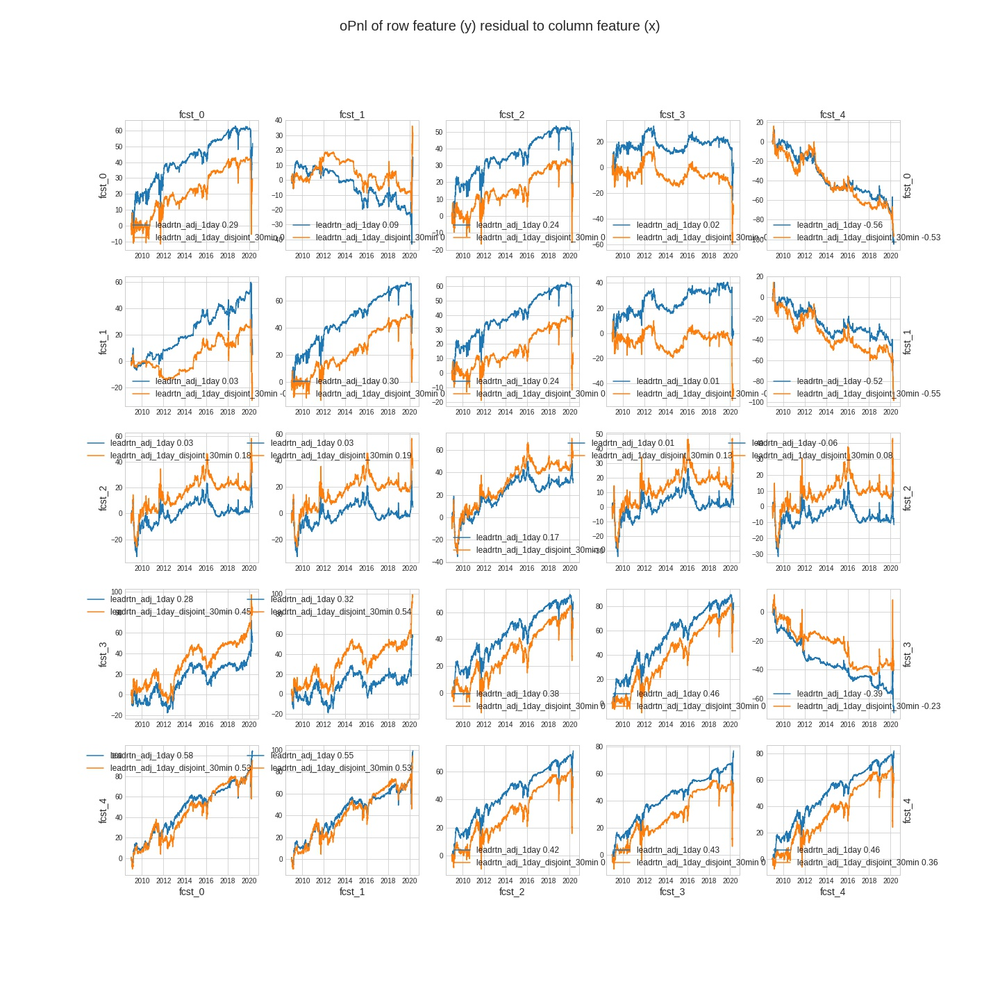

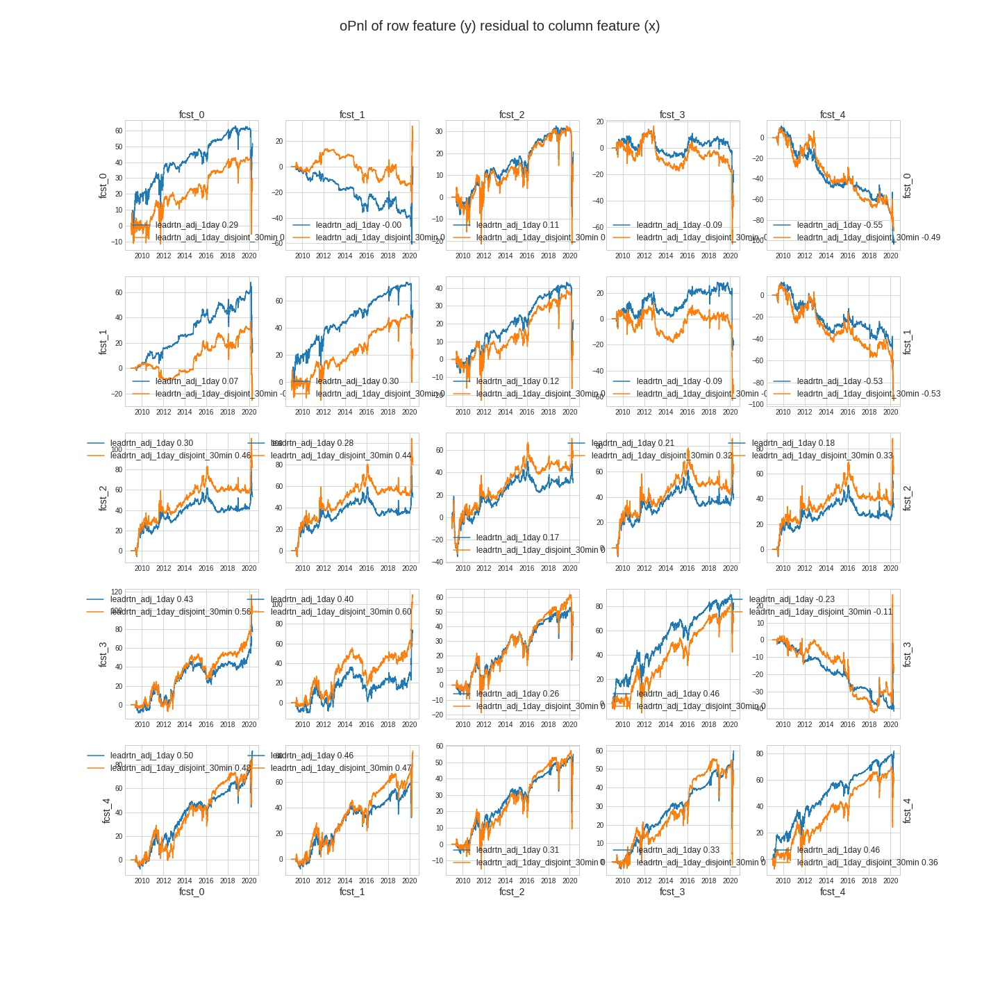

In [18]:
#  Colossus_340371d53
############################################################################
BASELINE_NAME = 'Colossus_340371d53'
PREV_BASELINE = 'Colossus_d17cf1e84'
BASELINE_NOTES = 'trying minibatch = 20 '
if PREV_BASELINE and BASELINE_NOTES:
    BASELINE_NOTES += f' (follows {PREV_BASELINE}) '
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# set the input data
INTS_PER_DAY = 1
data = daily_data 

phps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end,  #
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=None, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
        winsorize_weight=None, #winsorizes the learning weight (not the regression weight)
        winsorize_orthos=None,
        normalize_orthos=True,
    ),        
    # hps related to profiling
    profiling=mx.HPSet(
        xsw=False,
        xsz=False,
        clip=None,
        exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_1day'],
        targets=['leadrtn_adj_1day', 'leadrtn_adj_1day_disjoint_30min' ],
        weight='valid_30min',
        
    ),
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min_13.rw_mean', 'log_open_unadj_30min', 'open_unadj_30min' ]
        + hps.feature_set.lagging_daily
        + hps.feature_set.vol
        + hps.feature_set.log_volumes_daily
        # + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.betas
        # + hps.feature_set.technical
        # + hps.feature_set.afacs                
    ) ),
    lookahead=2, #global lookahead
    targets=(
        []
        +['leadrtn_adj_1day'] 
    ),
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    weight='valid_30min',    
    colossus=mx.HPSet(
        minibatch=20,
        batch_size=2000,
        burn_in=2000,
        alphas=[],
        boost=1e-1,
        loss='psr',
        kappa=2,
        halflife_kappa=20,
        tv=1,
        ortho=1,
        omega=None,        
        gamma=None,
        theta=None,
        furiosa=None,
        alpha_transformer=mx.HPSet( winsorize=0.05, pre_normalize=mx.HPSet( halflife='xw', clip=3 ), subset=False, hydra=False, transform=None,  
                                    ema_halflifes=[], #5*INTS_PER_DAY, 20*INTS_PER_DAY], #, 40*INTS_PER_DAY, 60*INTS_PER_DAY,], 
                                    post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None),  ), 
        zeta_transformer=mx.HPSet( winsorize=0.01, post_normalize=False), #mx.HPSet( halflife=None, clip=3) ), 
        priming=100,        
    )
)


alpha_proto = mx.HPSet( 
    ar=10,
    ridge=1e-6,
    halflife_polyak=30,
    H=1,
    lr=1e-6,
    mode='bilinear',
    use_bias=True,
    rank=None,
    transformer=None,
)
phps.colossus.alphas = alpha_proto

import madmax.furyroad as mxf
from research.etf_technical import colossus_runner as recr
mxf = mxf.reload()
mxtr = mxtr.reload()
reload( recr )

# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline.hps == phps, 'failure to valdiate hyperparams'
        disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = recr.run_pipeline( data, hps=phps,  prev_baseline=PREV_BASELINE, memoize=True )
    disp( f'Expected {BASELINE_NAME}  got ', runner.name, h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        # let's give this fucker a name
        if not BASELINE_NAME: 
            BASELINE_NAME = runner.name 
        baseline = mx.Baseline.make( runner, hps=phps, notebook=Config.code,  notes=BASELINE_NOTES,  name=BASELINE_NAME   )
        disp( 'Baselined ', BASELINE_NAME, h=2, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    
    
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( 'Regressions', reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )

# compare this with other forecasts in the same dataarray if needed ...
comparator = mx.ForecastComparator( targets=phps.profiling.targets, weight=phps.profiling.weight, winlen=100 )
_ = comparator.compare( baseline, forecasts=baseline.output_features[-5:] )



# Colossus_35e47df04
## Testing the fully refactored Corpus/Colossus/Centauri  (follows Colossus_340371d53) 

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_1day,NaN,1688976,0.918845,778.536812,1.085278,0.013914,0.000194,17.321735,2.387021,0.914934,0.91494,0.906528
leadrtn_adj_1day_disjoint_30min,NaN,1688976,0.918515,778.536812,0.875727,0.009392,0.000088,11.717897,1.522844,0.914934,0.91494,0.906528


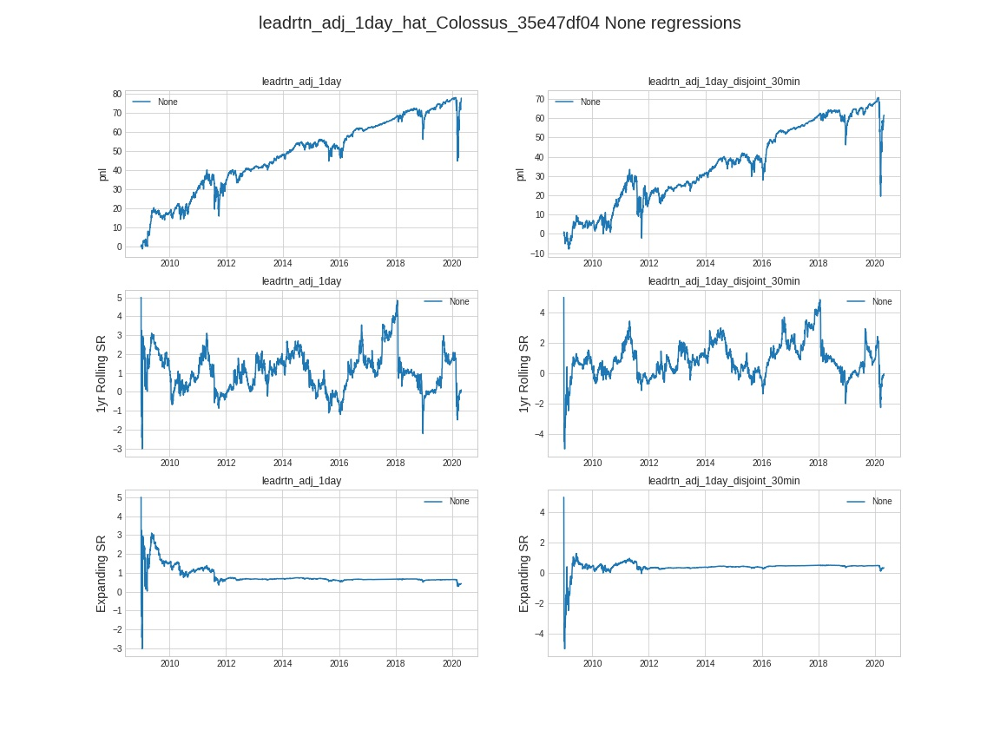

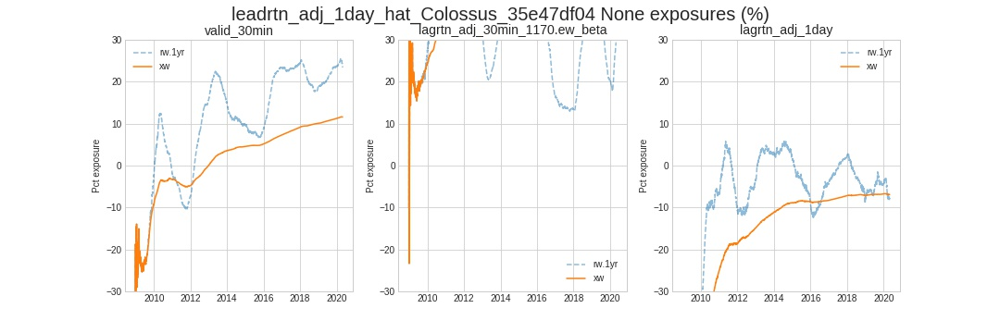

,0
leadrtn_adj_1day_hat_Colossus_06cb73372,fcst_0
leadrtn_adj_1day_xs_zscore_hat_OnlineRNN_16fb41e6b,fcst_1
leadrtn_adj_1day_hat_Colossus_d17cf1e84,fcst_2
leadrtn_adj_1day_hat_Colossus_340371d53,fcst_3
leadrtn_adj_1day_hat_Colossus_35e47df04,fcst_4


,fcst_0,fcst_1,fcst_2,fcst_3,fcst_4
fcst_0,1.000000,0.281382,0.825014,0.815229,0.801797
fcst_1,0.281382,1.000000,0.276364,0.237590,0.245676
fcst_2,0.825014,0.276364,1.000000,0.863721,0.886729
fcst_3,0.815229,0.237590,0.863721,1.000000,0.939103
fcst_4,0.801797,0.245676,0.886729,0.939103,1.000000


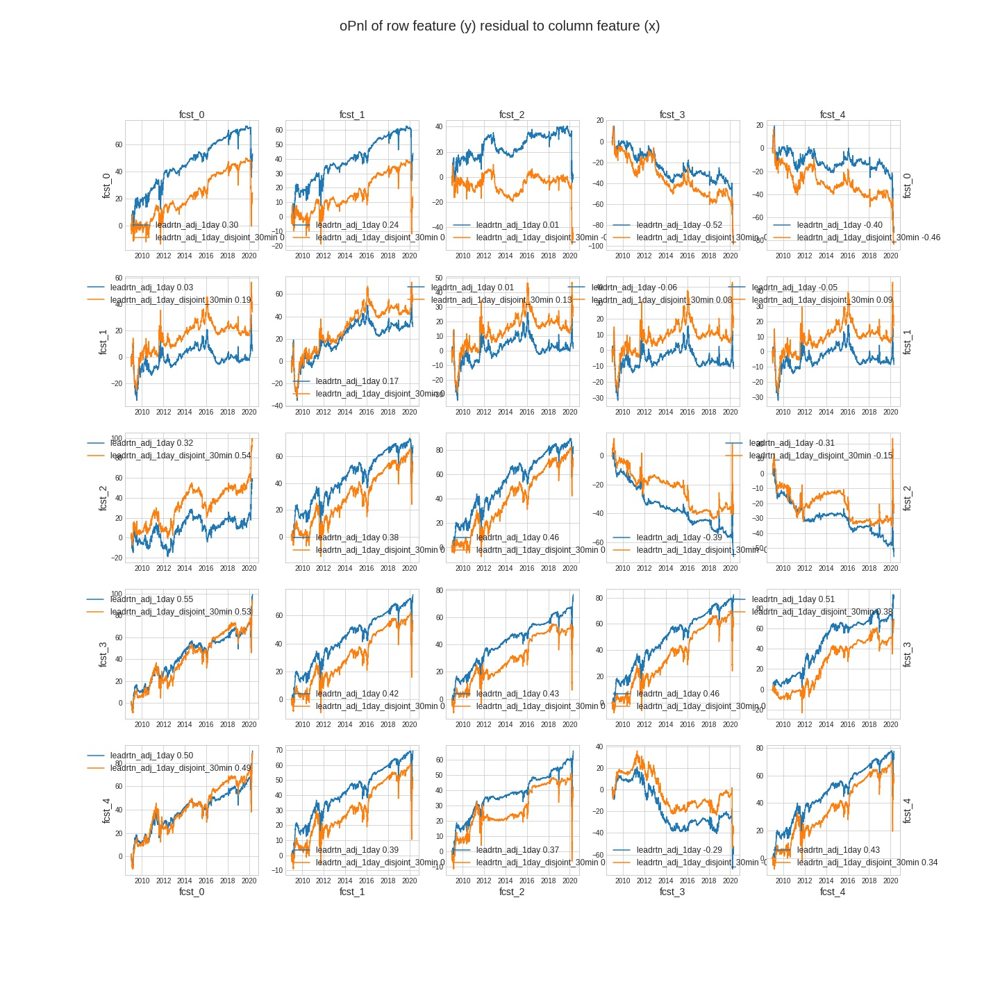

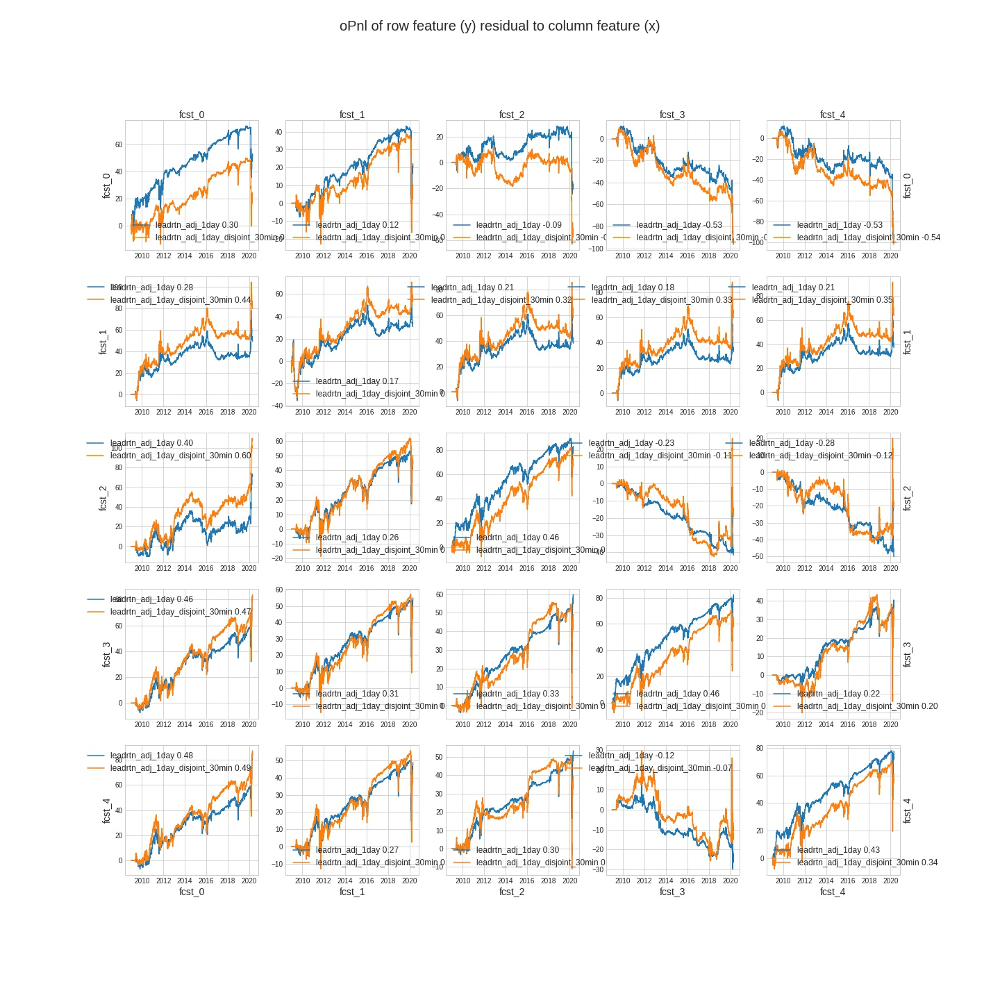

In [34]:
# Colossus_35e47df04
############################################################################
BASELINE_NAME = 'Colossus_35e47df04'
PREV_BASELINE = 'Colossus_340371d53'
BASELINE_NOTES = 'Testing the fully refactored Corpus/Colossus/Centauri '
if PREV_BASELINE and BASELINE_NOTES:
    BASELINE_NOTES += f' (follows {PREV_BASELINE}) '
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# set the input data
INTS_PER_DAY = 1
data = daily_data 

phps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end,  #
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=None, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
        winsorize_weight=None, #winsorizes the learning weight (not the regression weight)
        winsorize_orthos=None,
        normalize_orthos=True,
    ),        
    # hps related to profiling
    profiling=mx.HPSet(
        xsw=False,
        xsz=False,
        clip=None,
        exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_1day'],
        targets=['leadrtn_adj_1day', 'leadrtn_adj_1day_disjoint_30min' ],
        weight='valid_30min',
        
    ),
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min_13.rw_mean', 'log_open_unadj_30min', 'open_unadj_30min' ]
        + hps.feature_set.lagging_daily
        + hps.feature_set.vol
        + hps.feature_set.log_volumes_daily
        # + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.betas
        # + hps.feature_set.technical
        # + hps.feature_set.afacs                
    ) ),
    lookahead=2, #global lookahead
    targets=(
        []
        +['leadrtn_adj_1day'] 
    ),
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    weight='valid_30min',    
    colossus=mx.HPSet(
        minibatch=20,
        batch_size=2000,
        burn_in=2000,
        boost=1e-1,
        loss='psr',
        kappa=2,
        halflife_kappa=20,
        halflife_polyak=30,
        tv=1,
        ortho=1,
        priming=100,        
        alpha_centauri=mx.HPSet(
            alphas=None,
#             [
#                 mx.HPSet( lr=1e-6, transformer=None, ),
                
#             ],
            mode='bilinear',
            rank=None,
            M=1,
            ar=10,
            ridge=1e-6,
            lr=1e-6,
            use_bias=True,
            transformer=mx.HPSet( winsorize=0.05, pre_normalize=mx.HPSet( halflife='xw', clip=3 ), subset=False, hydra=False, transform=None,  
                                  ema_halflifes=[], #5*INTS_PER_DAY, 20*INTS_PER_DAY], #, 40*INTS_PER_DAY, 60*INTS_PER_DAY,], 
                                  post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None),)
        ),
        omega=None,        
        gamma=None,
        theta=None,
        zeta_transformer=mx.HPSet( winsorize=0.01, post_normalize=False), #mx.HPSet( halflife=None, clip=3) ), 
    ),
    verbose=True,
)

mxtr = mxtr.reload()
import madmax.furyroad as mxf; mxf = mxf.reload()
from research.etf_technical import furyroad_runner as refr; reload( refr )



# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline.hps == phps, 'failure to valdiate hyperparams'
        disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = refr.run_pipeline( data, hps=phps,  prev_baseline=PREV_BASELINE, memoize=True )
    disp( f'Expected {BASELINE_NAME}  got ', runner.name, h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        # let's give this fucker a name
        if not BASELINE_NAME: 
            BASELINE_NAME = runner.name 
        baseline = mx.Baseline.make( runner, hps=phps, notebook=Config.code,  notes=BASELINE_NOTES,  name=BASELINE_NAME   )
        disp( 'Baselined ', BASELINE_NAME, h=2, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    
    
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( 'Regressions', reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )

# compare this with other forecasts in the same dataarray if needed ...
comparator = mx.ForecastComparator( targets=phps.profiling.targets, weight=phps.profiling.weight, winlen=100 )
_ = comparator.compare( baseline, forecasts=baseline.output_features[-5:] )



# Colossus_c4157e1c5
## Testing Colossus with multiple alphas and theta corpus (follows Colossus_35e47df04) 

,num_calls,duration_total,duration_mean,duration_squared,duration_std
alphas,5296,276.409398,5.218225e-02,2.731380e-03,2.896928e-03
burn_in,1,138.625798,6.931290e+01,9.608556e+03,6.931290e+01
forward,2,236.337736,7.877925e+01,9.659867e+03,5.876816e+01
gamma_stage,5296,0.004149,7.832210e-07,7.008471e-13,2.956550e-07
theta_stage,5296,70.052655,1.322497e-02,1.781648e-04,1.806931e-03
zeta,5296,17.775014,3.355676e-03,1.155000e-05,5.379958e-04


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_1day,NaN,1688976,0.918845,1225.242346,1.012293,0.026726,0.000714,33.307682,2.416947,0.00056,0.00067,0.000028
leadrtn_adj_1day_disjoint_30min,NaN,1688976,0.918515,1225.242346,0.513501,0.006064,0.000037,7.597972,0.446395,0.00056,0.00067,0.000028


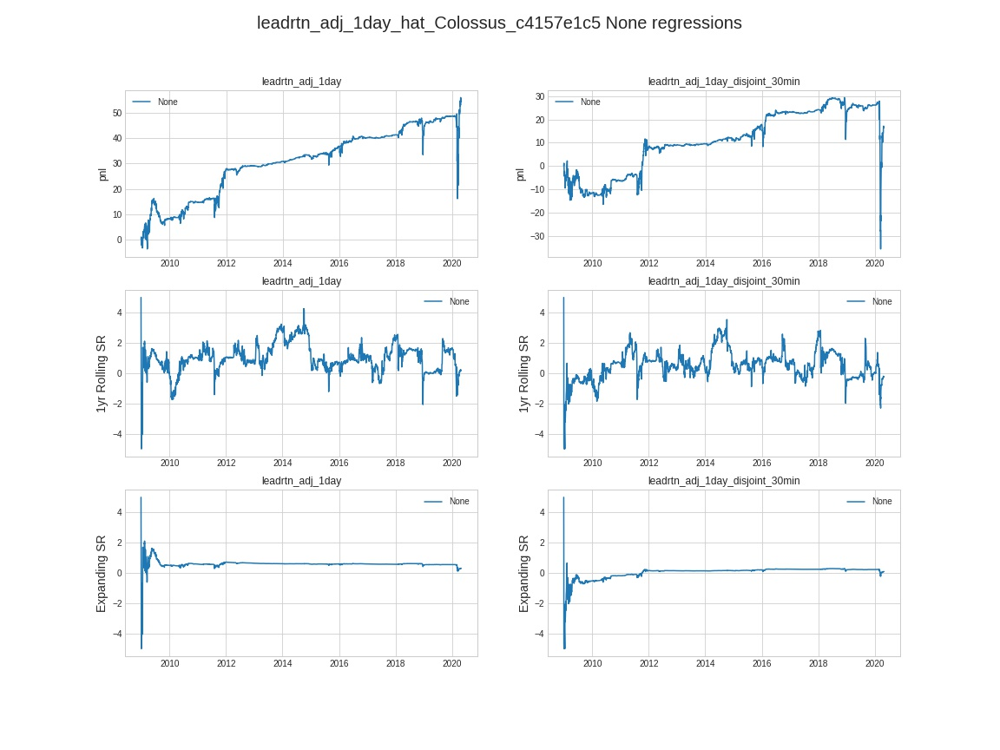

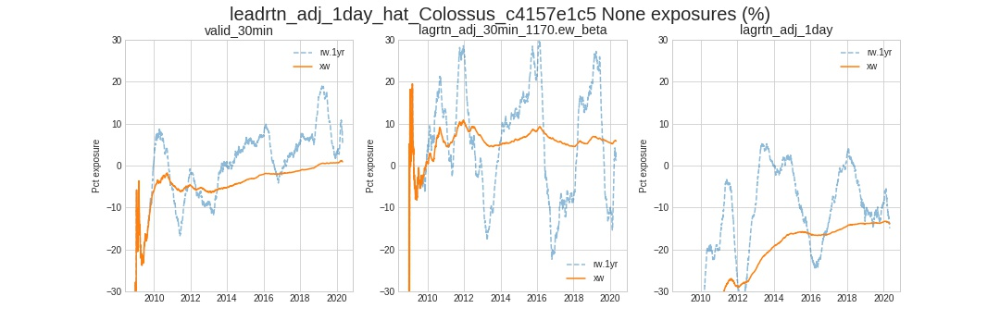

,0
leadrtn_adj_1day_xs_zscore_hat_OnlineRNN_16fb41e6b,fcst_0
leadrtn_adj_1day_hat_Colossus_d17cf1e84,fcst_1
leadrtn_adj_1day_hat_Colossus_340371d53,fcst_2
leadrtn_adj_1day_hat_Colossus_35e47df04,fcst_3
leadrtn_adj_1day_hat_Colossus_c4157e1c5,fcst_4


,fcst_0,fcst_1,fcst_2,fcst_3,fcst_4
fcst_0,1.000000,0.276364,0.237590,0.245709,0.094094
fcst_1,0.276364,1.000000,0.863721,0.886753,0.392803
fcst_2,0.237590,0.863721,1.000000,0.938983,0.547065
fcst_3,0.245709,0.886753,0.938983,1.000000,0.516518
fcst_4,0.094094,0.392803,0.547065,0.516518,1.000000


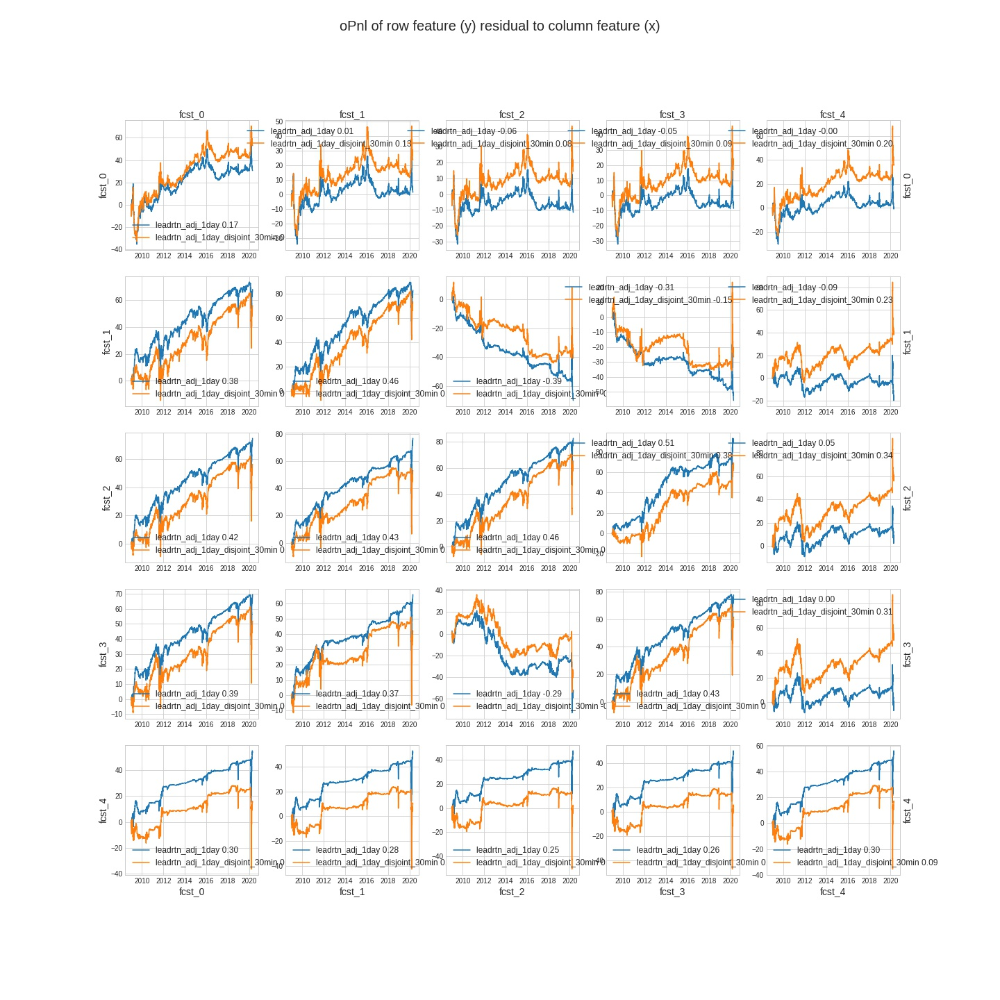

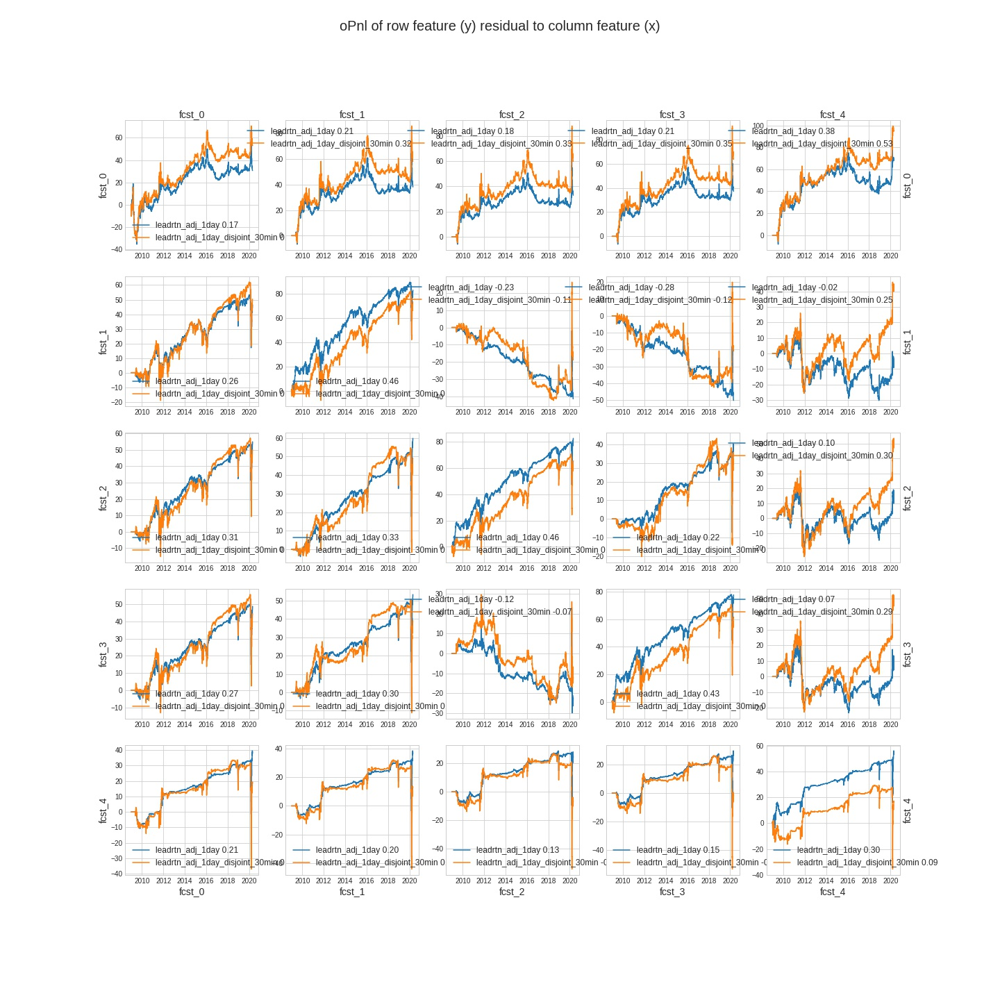

In [20]:
# Colossus_c4157e1c5
############################################################################
BASELINE_NAME = 'Colossus_c4157e1c5'
PREV_BASELINE = 'Colossus_35e47df04'
BASELINE_NOTES = 'Testing Colossus with multiple alphas and theta corpus'
if PREV_BASELINE and BASELINE_NOTES:
    BASELINE_NOTES += f' (follows {PREV_BASELINE}) '
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# set the input data
INTS_PER_DAY = 1
data = daily_data 

phps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end,  #
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=None, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
        winsorize_weight=None, #winsorizes the learning weight (not the regression weight)
        winsorize_orthos=None,
        normalize_orthos=True,
    ),        
    # hps related to profiling
    profiling=mx.HPSet(
        xsw=False,
        xsz=False,
        clip=None,
        exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_1day'],
        targets=['leadrtn_adj_1day', 'leadrtn_adj_1day_disjoint_30min' ],
        weight='valid_30min',
        
    ),
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min_13.rw_mean', 'log_open_unadj_30min', 'open_unadj_30min' ]
        + hps.feature_set.lagging_daily
        + hps.feature_set.vol
        + hps.feature_set.log_volumes_daily
        # + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.betas
        # + hps.feature_set.technical
        # + hps.feature_set.afacs                
    ) ),
    lookahead=2, #global lookahead
    targets=(
        []
        +['leadrtn_adj_1day'] 
    ),
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    weight='valid_30min',    
    colossus=mx.HPSet(
        minibatch=20,
        batch_size=2000,
        burn_in=2000,
        priming=100,        
        # defaults
        boost=1,
        loss='l2',
        kappa=2,
        halflife_kappa=20,
        halflife_polyak=30,
        tv=1,
        ortho=5,
        alphas=[
            mx.HPSet(
                mode='bilinear',
                rank=None,
                M=1,
                ar=10,
                ridge=1e-9,
                lr=1e-6,                        
                use_bias=True,
                boost=1,
                kappa=2,
                transformer=None,
            )
        ],
        alpha_transformer=mx.HPSet( winsorize=0.05, pre_normalize=mx.HPSet( halflife='xw', clip=3 ) ),        
        omega=None,        
        gamma=None,
        theta=mx.HPSet( lr=5, ridge=None, shift=0.05 ),
        zeta_transformer=mx.HPSet( winsorize=0.01, post_normalize=False), #mx.HPSet( halflife=None, clip=3) ), 
    ),    
)

mxtr = mxtr.reload()
import madmax.furyroad as mxf; mxf = mxf.reload()
from research.etf_technical import furyroad_runner as refr; reload( refr )

transformer=mx.HPSet( hydra=False, ema_halflifes=[], post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) )
alphas = [
    dict( lr=1e-6, kappa=2, ar=10, ortho=5, transformer=transformer.clone( ema_halflifes=[2*INTS_PER_DAY])  ),
    dict( lr=1e-7, kappa=3, halflife_kappa=None, ar=20, ortho=5, transformer=transformer.clone( ema_halflifes=[5*INTS_PER_DAY, 30*INTS_PER_DAY])  ),
    dict( lr=1e-7, kappa=4, halflife_kappa=None, ar=20, ortho=5, transformer=transformer.clone( ema_halflifes=[20*INTS_PER_DAY, 60*INTS_PER_DAY])  ),
]
for a in alphas:
    phps.colossus.alphas.append( phps.colossus.alphas[0].clone( **a ) )

# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline.hps == phps, 'failure to valdiate hyperparams'
        disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = refr.run_pipeline( data, hps=phps,  prev_baseline=PREV_BASELINE, memoize=True, verbose=True )
    disp( f'Expected {BASELINE_NAME}  got ', runner.name, h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        # let's give this fucker a name
        if not BASELINE_NAME: 
            BASELINE_NAME = runner.name 
        baseline = mx.Baseline.make( runner, hps=phps, notebook=Config.code,  notes=BASELINE_NOTES,  name=BASELINE_NAME   )
        disp( 'Baselined ', BASELINE_NAME, h=2, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( 'Regressions', reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )

# compare this with other forecasts in the same dataarray if needed ...
comparator = mx.ForecastComparator( targets=phps.profiling.targets, weight=phps.profiling.weight, winlen=100 )
_ = comparator.compare( baseline, forecasts=baseline.output_features[-5:] )



# Colossus_31efaa3e3
## baseline with 1 alpha - no omega (follows Colossus_c4157e1c5) 

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_1day,NaN,1688976,0.918845,646.847438,0.962028,0.010734,0.000115,13.381527,2.469434,0.870905,0.865532,0.85261
leadrtn_adj_1day_disjoint_30min,NaN,1688976,0.918515,646.847438,0.714748,0.005673,0.000032,7.068436,1.126842,0.870905,0.865532,0.85261


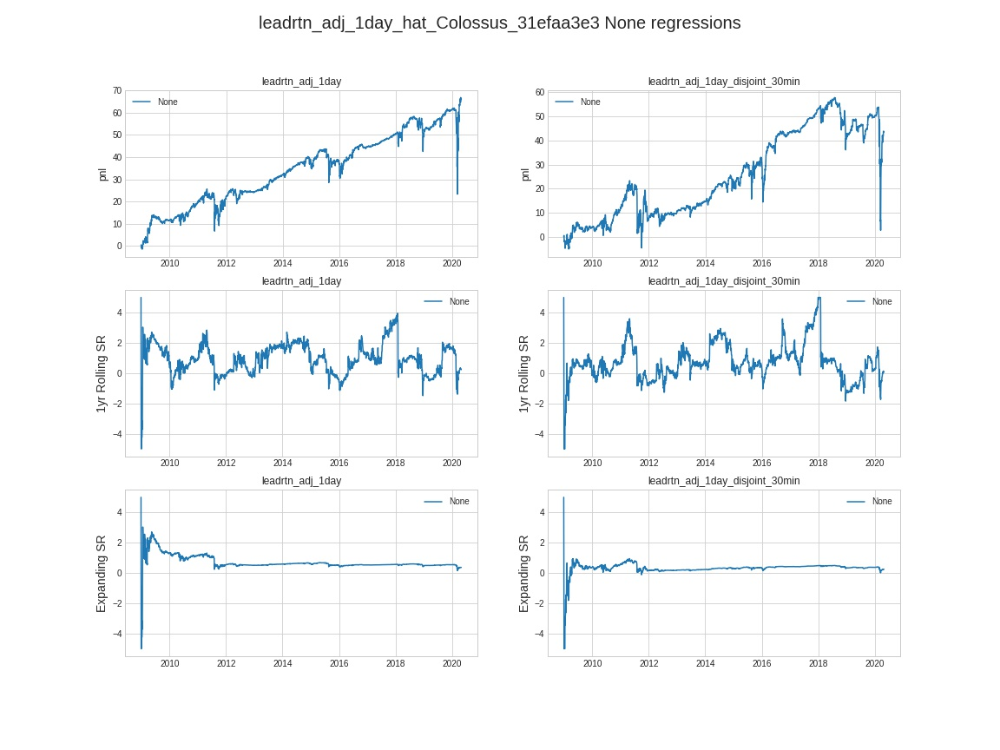

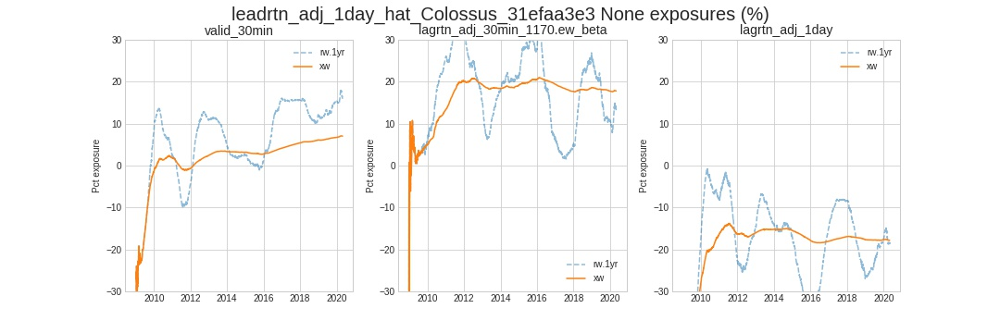

,0
leadrtn_adj_1day_hat_Colossus_d17cf1e84,fcst_0
leadrtn_adj_1day_hat_Colossus_340371d53,fcst_1
leadrtn_adj_1day_hat_Colossus_35e47df04,fcst_2
leadrtn_adj_1day_hat_Colossus_c4157e1c5,fcst_3
leadrtn_adj_1day_hat_Colossus_31efaa3e3,fcst_4


,fcst_0,fcst_1,fcst_2,fcst_3,fcst_4
fcst_0,1.000000,0.863721,0.886753,0.392842,0.746365
fcst_1,0.863721,1.000000,0.938983,0.547115,0.721436
fcst_2,0.886753,0.938983,1.000000,0.516567,0.778743
fcst_3,0.392842,0.547115,0.516567,1.000000,0.458339
fcst_4,0.746365,0.721436,0.778743,0.458340,1.000000


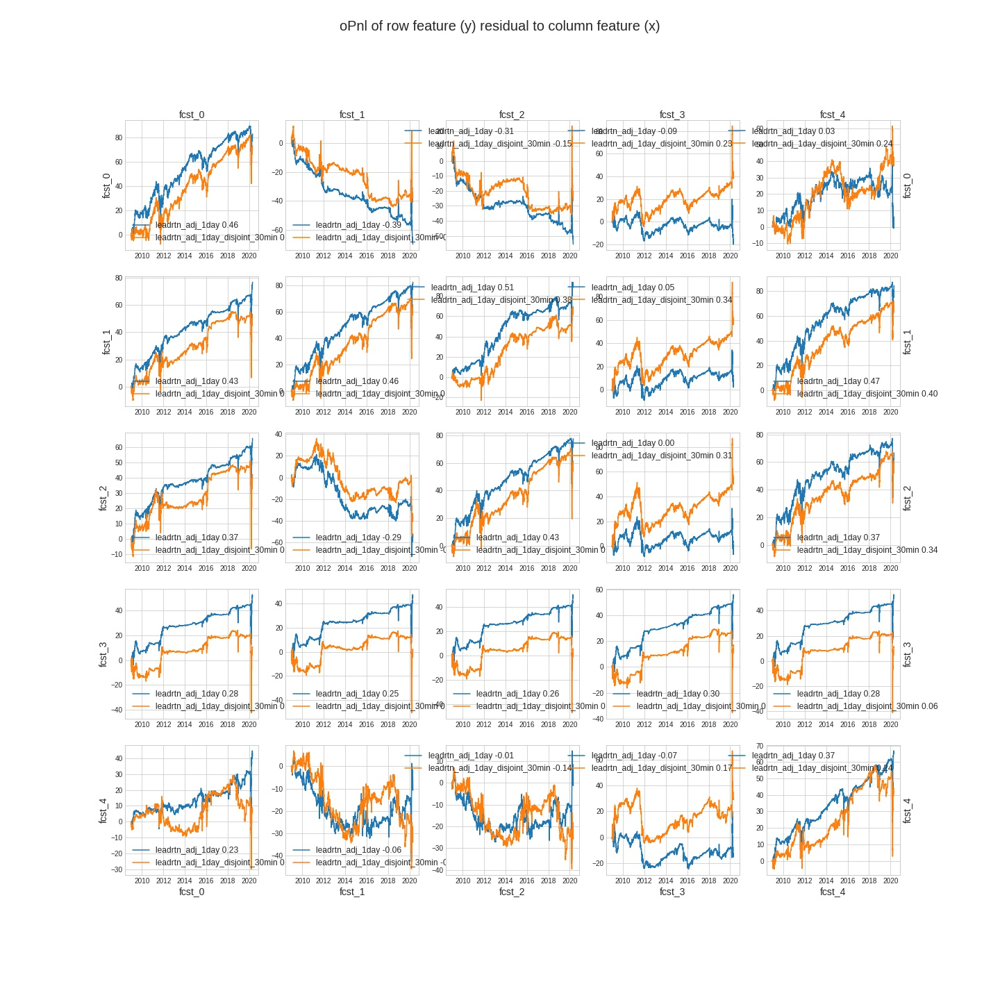

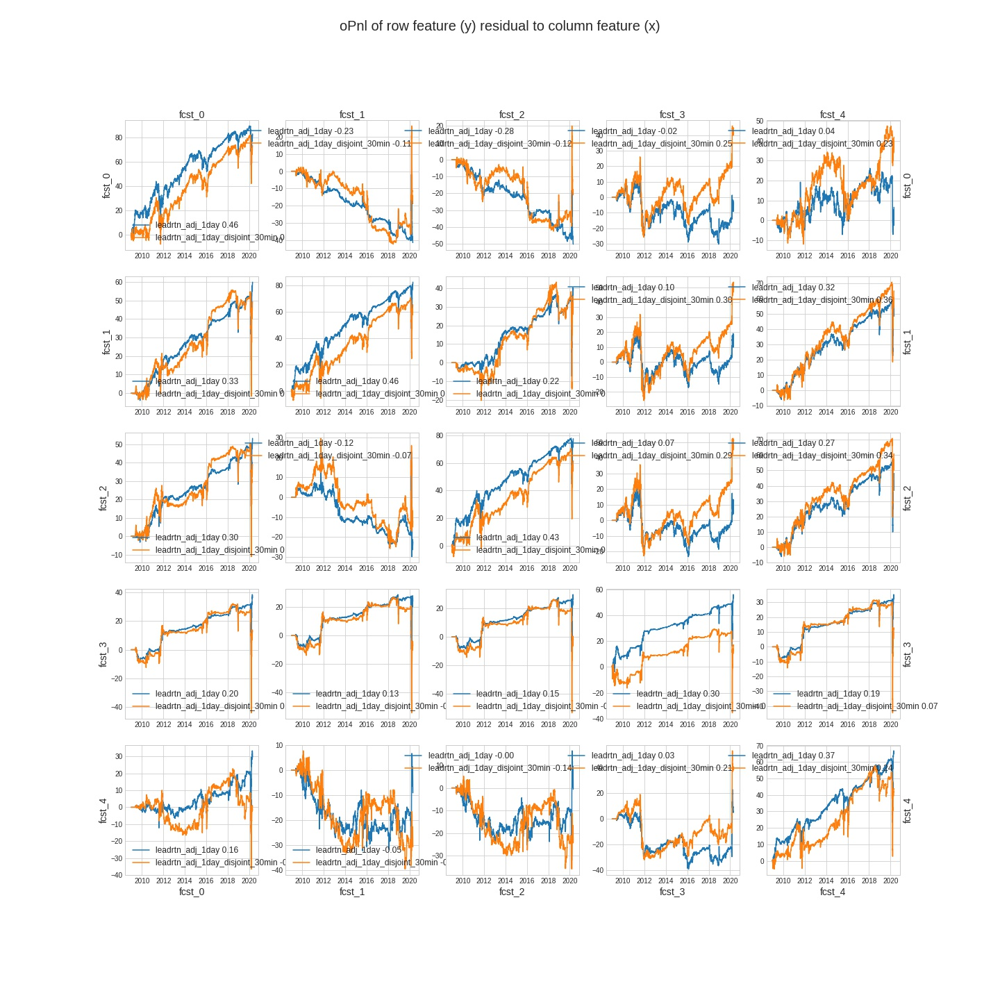

In [38]:
# Colossus_31efaa3e3
############################################################################
BASELINE_NAME = 'Colossus_31efaa3e3'
PREV_BASELINE = 'Colossus_c4157e1c5'
BASELINE_NOTES = 'baseline with 1 alpha - no omega'
if PREV_BASELINE and BASELINE_NOTES:
    BASELINE_NOTES += f' (follows {PREV_BASELINE}) '
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# set the input data
INTS_PER_DAY = 1
data = daily_data 

phps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end,  #
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=None, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
        winsorize_weight=None, #winsorizes the learning weight (not the regression weight)
        winsorize_orthos=None,
        normalize_orthos=True,
    ),        
    # hps related to profiling
    profiling=mx.HPSet(
        xsw=False,
        xsz=False,
        clip=None,
        exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_1day'],
        targets=['leadrtn_adj_1day', 'leadrtn_adj_1day_disjoint_30min' ],
        weight='valid_30min',
        
    ),
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min_13.rw_mean', 'log_open_unadj_30min', 'open_unadj_30min' ]
        + hps.feature_set.lagging_daily
        + hps.feature_set.vol
        + hps.feature_set.log_volumes_daily
        # + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.betas
        # + hps.feature_set.technical
        # + hps.feature_set.afacs                
    ) ),
    lookahead=2, #global lookahead
    targets=(
        []
        +['leadrtn_adj_1day'] 
    ),
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    weight='valid_30min',    
    colossus=mx.HPSet(
        minibatch=30,
        batch_size=2000,
        burn_in=2000,
        priming=200,        
        # defaults
        boost=1,
        loss='psr',
        kappa=2,
        halflife_kappa=None,
        halflife_polyak=30,
        tv=1,
        ortho=3,
        alphas=[
            mx.HPSet(
                mode='bilinear',
                rank=None,
                M=1,
                ar=10,
                ridge=1e-6,
                lr=1e-6,                        
                use_bias=True,
                transformer=mx.HPSet( hydra=False, ema_halflifes=[], post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) ),
            )
        ],
        alpha_transformer=mx.HPSet( winsorize=0.05, pre_normalize=mx.HPSet( halflife=100, clip=3 ), subset=None, transform=None ),        
        omega=None, #mx.HPSet( lr=1.0, ridge=1e-3, shift=0.1, transformer=None ),
        gamma=None,
        theta=None, #mx.HPSet( lr=10, ridge=1e-3, shift=0.1 ),
        furiosa=None, #mx.HPSet( lr=1e-2, ridge=1, lr_min=0.01, lr_max=100,  ),
        zeta_transformer=mx.HPSet( winsorize=0.01, post_normalize=False ), #mx.HPSet( halflife=None, clip=3) ), 
    ),    
)

mxtr = mxtr.reload()
import madmax.furyroad as mxf; mxf = mxf.reload()
from research.etf_technical import furyroad_runner as refr; reload( refr )

# alphas = [
#     dict( transformer=phps.colossus.alphas[0].transformer.clone( hydra=True )  ),
#     dict( transformer=phps.colossus.alphas[0].transformer.clone( ema_halflifes=[2*INTS_PER_DAY, 5*INTS_PER_DAY, 20*INTS_PER_DAY])  ),
#     dict( lr=1e-8, transformer=phps.colossus.alphas[0].transformer.clone( hydra=True, ema_halflifes=[2*INTS_PER_DAY, 5*INTS_PER_DAY, 20*INTS_PER_DAY])  ),
# ]
# for a in alphas:
#     phps.colossus.alphas.append( phps.colossus.alphas[0].clone( **a ) )


# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline.hps == phps, 'failure to valdiate hyperparams'
        disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = refr.run_pipeline( data, hps=phps,  prev_baseline=PREV_BASELINE, memoize=True, verbose=True )
    disp( f'Expected {BASELINE_NAME}  got ', runner.name, h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        # let's give this fucker a name
        if not BASELINE_NAME: 
            BASELINE_NAME = runner.name 
        baseline = mx.Baseline.make( runner, hps=phps, notebook=Config.code,  notes=BASELINE_NOTES,  name=BASELINE_NAME   )
        disp( 'Baselined ', BASELINE_NAME, h=2, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( 'Regressions', reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )    
    
comparator = mx.ForecastComparator( targets=phps.profiling.targets, weight=phps.profiling.weight, winlen=100 )
_ = comparator.compare( baseline, forecasts=baseline.output_features[-5:] )



# Colossus_7ddb133ff
## Measuing the value of omega over previous baseline   (follows Colossus_31efaa3e3) 

,num_calls,duration_total,duration_mean,duration_squared,duration_std
alphas,5266,80.701987,0.015322,2.365752e-04,1.343726e-03
burn_in,1,56.645183,28.322591,1.604338e+03,2.832259e+01
forward,2,97.184437,32.394812,1.634522e+03,2.418881e+01
gamma_stage,5266,0.005324,0.000001,1.124856e-12,3.212944e-07
omega,5266,48.062885,0.009125,8.408119e-05,9.001841e-04
zeta,5266,17.450825,0.003313,1.110924e-05,3.628910e-04


,name,type,shape,numel,norm,dtype,device,arguments
0,,Colossus,,2114,4.114415e-02,,,"{'alphas': [AlphaCorpus( mode='bilinear', ..."
1,alpha_transformer/,OnlineSequential,,0,0.000000e+00,,,{'args': <class 'inspect._empty'>}
2,alpha_transformer/_module_list/,ModuleList,,0,0.000000e+00,,,{'modules': <bound method Module.modules of Mo...
3,alpha_transformer/_module_list/0/,OnlineWinsorize,,0,0.000000e+00,,,{'winsorize': 0.05}
4,alpha_transformer/_module_list/0/_wins/,Winsorize,,0,0.000000e+00,,,"{'quantiles': [0.05, 0.95], 'dim': 0}"
5,alpha_transformer/_module_list/1/,OnlineNorm,,0,0.000000e+00,,,"{'demean': True, 'normalize': True, 'clip': 3,..."
6,alpha_transformer/_module_list/1/_ema/,EmaUpdater,,0,0.000000e+00,,,"{'biased': False, 'ignore_na': True, 'avg': Tr..."
7,alphas/,ModuleList,,1522,1.872933e-05,,,{'modules': <bound method Module.modules of Mo...
8,alphas/0/,AlphaCorpus,,1522,1.872933e-05,,,"{'mode': 'bilinear', 'use_bias': True, 'rank':..."
9,alphas/0/beta,Parameter,"(1, 39, 39)",1521,1.847206e-05,torch.float32,cuda:0,


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_1day,NaN,1688976,0.918845,623.358697,0.976039,0.011008,0.000121,13.724567,2.525565,0.872772,0.867431,0.85455
leadrtn_adj_1day_disjoint_30min,NaN,1688976,0.918515,623.358697,0.716042,0.005715,0.000033,7.112180,1.132374,0.872772,0.867431,0.85455


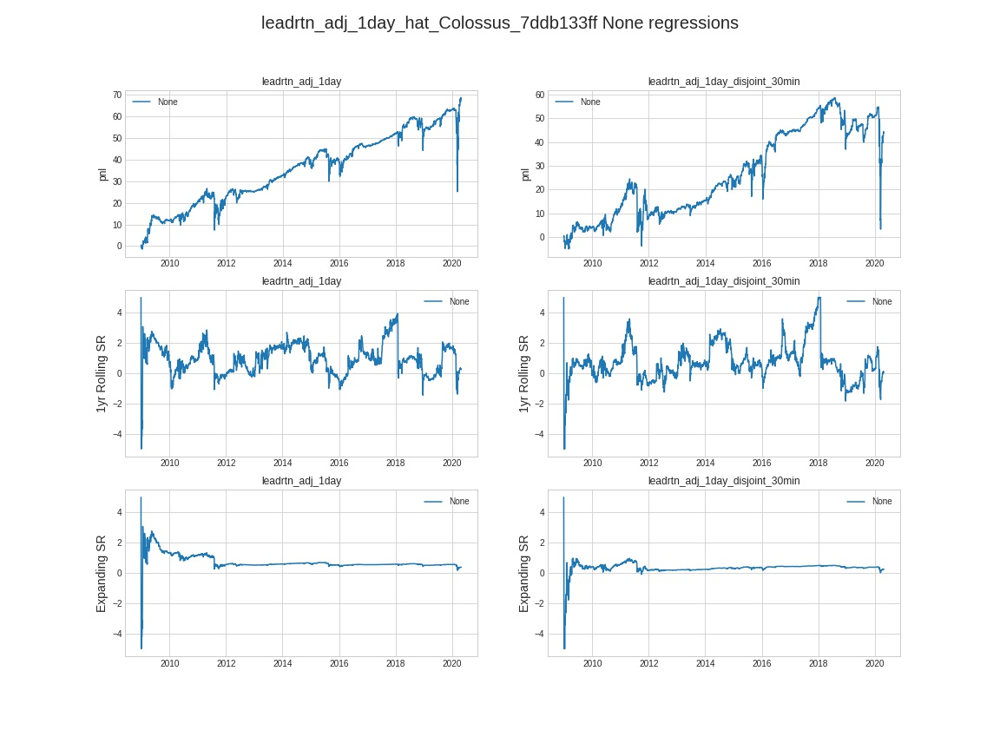

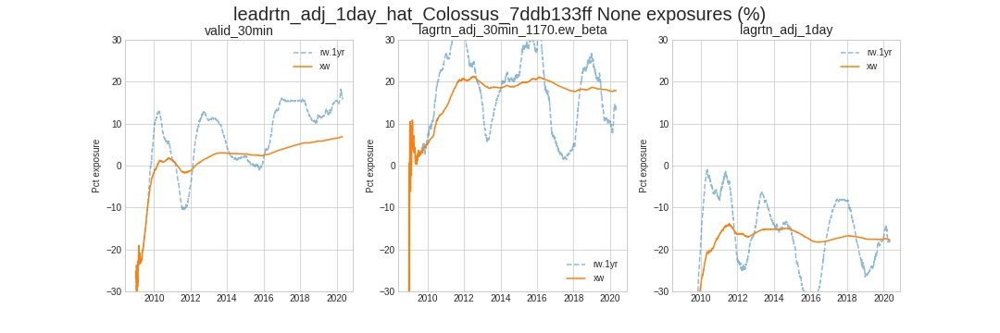

,0
leadrtn_adj_1day_hat_Colossus_c4157e1c5,fcst_0
leadrtn_adj_1day_hat_Colossus_31efaa3e3,fcst_1
leadrtn_adj_1day_hat_Colossus_7ddb133ff,fcst_2


,fcst_0,fcst_1,fcst_2
fcst_0,1.000000,0.458286,0.457222
fcst_1,0.458286,1.000000,0.998614
fcst_2,0.457222,0.998614,1.000000


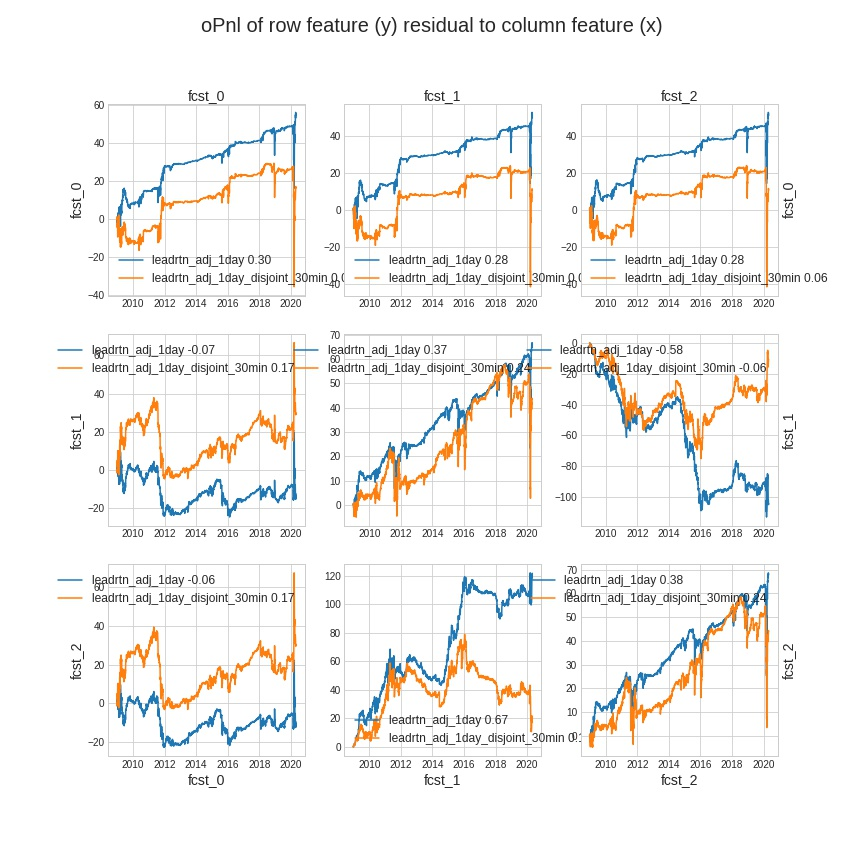

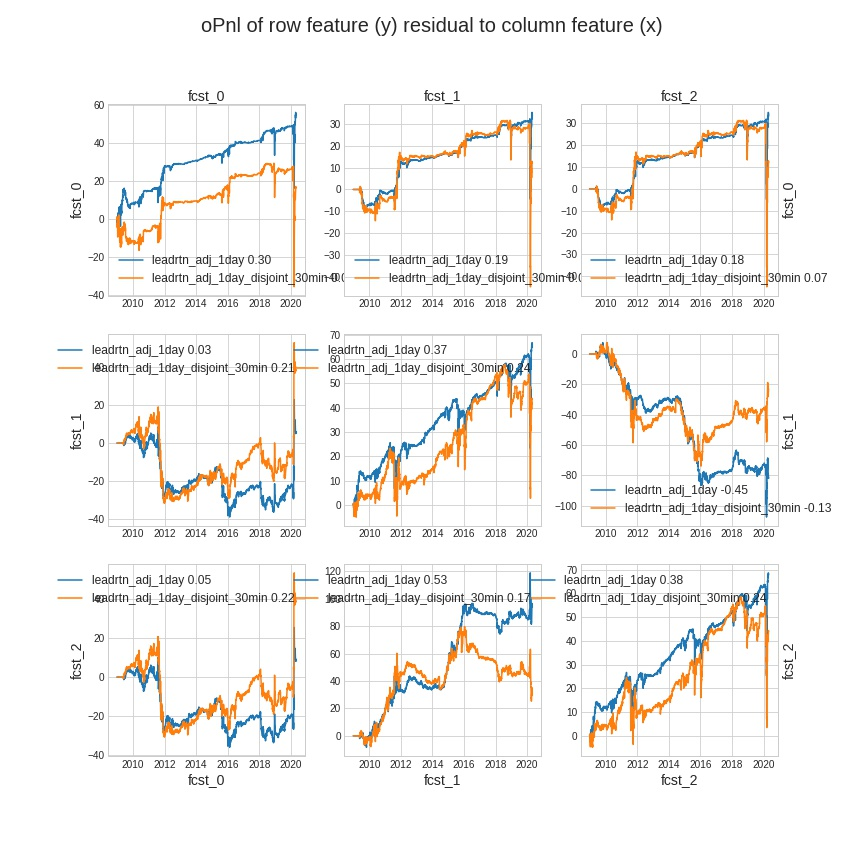

In [42]:
# Colossus_7ddb133ff
############################################################################
BASELINE_NAME = 'Colossus_7ddb133ff'
PREV_BASELINE = 'Colossus_31efaa3e3'
BASELINE_NOTES = 'Measuing the value of omega over previous baseline  '
if PREV_BASELINE and BASELINE_NOTES:
    BASELINE_NOTES += f' (follows {PREV_BASELINE}) '
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# set the input data
INTS_PER_DAY = 1
data = daily_data 

phps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end,  #
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=None, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
        winsorize_weight=None, #winsorizes the learning weight (not the regression weight)
        winsorize_orthos=None,
        normalize_orthos=True,
    ),        
    # hps related to profiling
    profiling=mx.HPSet(
        xsw=False,
        xsz=False,
        clip=None,
        exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_1day'],
        targets=['leadrtn_adj_1day', 'leadrtn_adj_1day_disjoint_30min' ],
        weight='valid_30min',
        
    ),
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min_13.rw_mean', 'log_open_unadj_30min', 'open_unadj_30min' ]
        + hps.feature_set.lagging_daily
        + hps.feature_set.vol
        + hps.feature_set.log_volumes_daily
        # + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.betas
        # + hps.feature_set.technical
        # + hps.feature_set.afacs                
    ) ),
    lookahead=2, #global lookahead
    targets=(
        []
        +['leadrtn_adj_1day'] 
    ),
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    weight='valid_30min',    
    colossus=mx.HPSet(
        minibatch=30,
        batch_size=2000,
        burn_in=2000,
        priming=200,        
        # defaults
        boost=1,
        loss='psr',
        kappa=2,
        halflife_kappa=None,
        halflife_polyak=30,
        tv=1,
        ortho=3,
        alphas=[
            mx.HPSet(
                mode='bilinear',
                rank=None,
                M=1,
                ar=10,
                ridge=1e-6,
                lr=1e-6,                        
                use_bias=True,
                transformer=mx.HPSet( hydra=False, ema_halflifes=[], post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) ),
            )
        ],
        alpha_transformer=mx.HPSet( winsorize=0.05, pre_normalize=mx.HPSet( halflife=100, clip=3 ), subset=None, transform=None ),        
        omega=mx.HPSet( lr=100.0, ridge=1e-2, shift=0.1, transformer=None ),
        gamma=None,
        theta=None, #mx.HPSet( lr=10, ridge=1e-3, shift=0.1 ),
        furiosa=None, #mx.HPSet( lr=1e-2, ridge=1, lr_min=0.01, lr_max=100,  ),
        zeta_transformer=mx.HPSet( winsorize=0.01, post_normalize=False ), #mx.HPSet( halflife=None, clip=3) ), 
    ),    
)

mxtr = mxtr.reload()
import madmax.furyroad as mxf; mxf = mxf.reload()
from research.etf_technical import furyroad_runner as refr; reload( refr )

# alphas = [
#     dict( transformer=phps.colossus.alphas[0].transformer.clone( hydra=True )  ),
#     dict( transformer=phps.colossus.alphas[0].transformer.clone( ema_halflifes=[2*INTS_PER_DAY, 5*INTS_PER_DAY, 20*INTS_PER_DAY])  ),
#     dict( lr=1e-8, transformer=phps.colossus.alphas[0].transformer.clone( hydra=True, ema_halflifes=[2*INTS_PER_DAY, 5*INTS_PER_DAY, 20*INTS_PER_DAY])  ),
# ]
# for a in alphas:
#     phps.colossus.alphas.append( phps.colossus.alphas[0].clone( **a ) )


# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline.hps == phps, 'failure to valdiate hyperparams'
        disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = refr.run_pipeline( data, hps=phps,  prev_baseline=PREV_BASELINE, memoize=True, verbose=True )
    disp( f'Expected {BASELINE_NAME}  got ', runner.name, h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        # let's give this fucker a name
        if not BASELINE_NAME: 
            BASELINE_NAME = runner.name 
        baseline = mx.Baseline.make( runner, hps=phps, notebook=Config.code,  notes=BASELINE_NOTES,  name=BASELINE_NAME   )
        disp( 'Baselined ', BASELINE_NAME, h=2, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( 'Regressions', reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )    
    
comparator = mx.ForecastComparator( targets=phps.profiling.targets, weight=phps.profiling.weight, winlen=100 )
_ = comparator.compare( baseline, forecasts=baseline.output_features[-3:] )



# Colossus_98060ed3a
## The value of multplying omega into the weights W before the alpha stage (follows Colossus_7ddb133ff) 

In [4]:
xₜ = 3




,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_1day,NaN,1688976,0.918845,674.199629,1.074355,0.013856,0.000192,17.243027,2.761252,-0.037796,-0.031394,-0.020878
leadrtn_adj_1day_disjoint_30min,NaN,1688976,0.918515,674.199629,0.776205,0.007114,0.000051,8.867366,1.268977,-0.037796,-0.031394,-0.020878


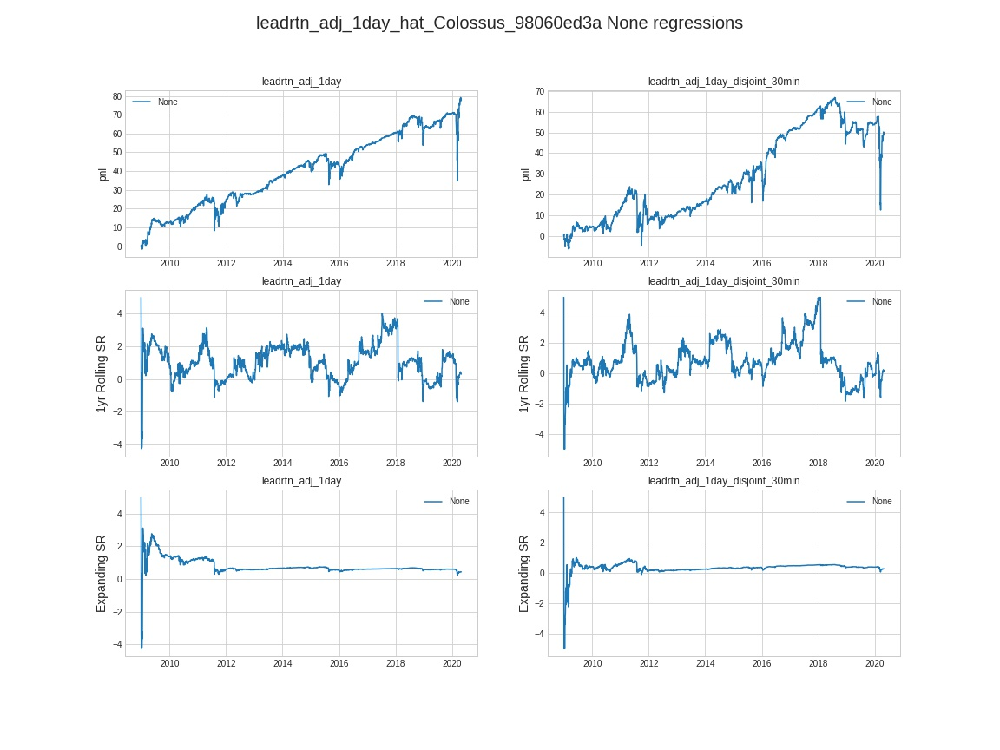

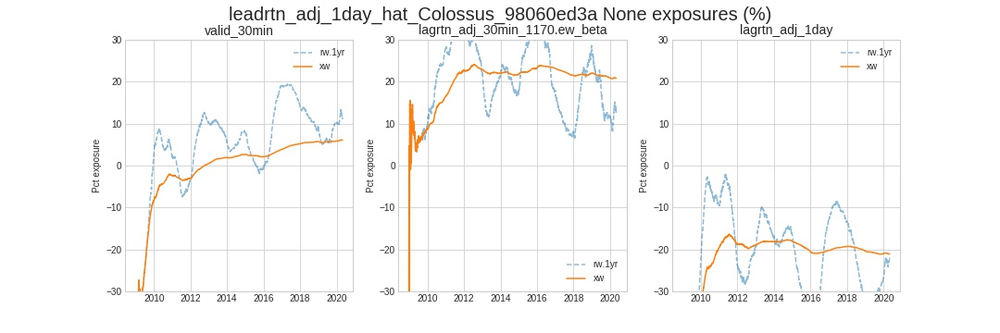

,0
leadrtn_adj_1day_hat_Colossus_c4157e1c5,fcst_0
leadrtn_adj_1day_hat_Colossus_31efaa3e3,fcst_1
leadrtn_adj_1day_hat_Colossus_7ddb133ff,fcst_2
leadrtn_adj_1day_hat_Colossus_98060ed3a,fcst_3


,fcst_0,fcst_1,fcst_2,fcst_3
fcst_0,1.000000,0.458396,0.457332,0.467071
fcst_1,0.458396,1.000000,0.998613,0.865225
fcst_2,0.457332,0.998613,1.000000,0.864668
fcst_3,0.467071,0.865225,0.864668,1.000000


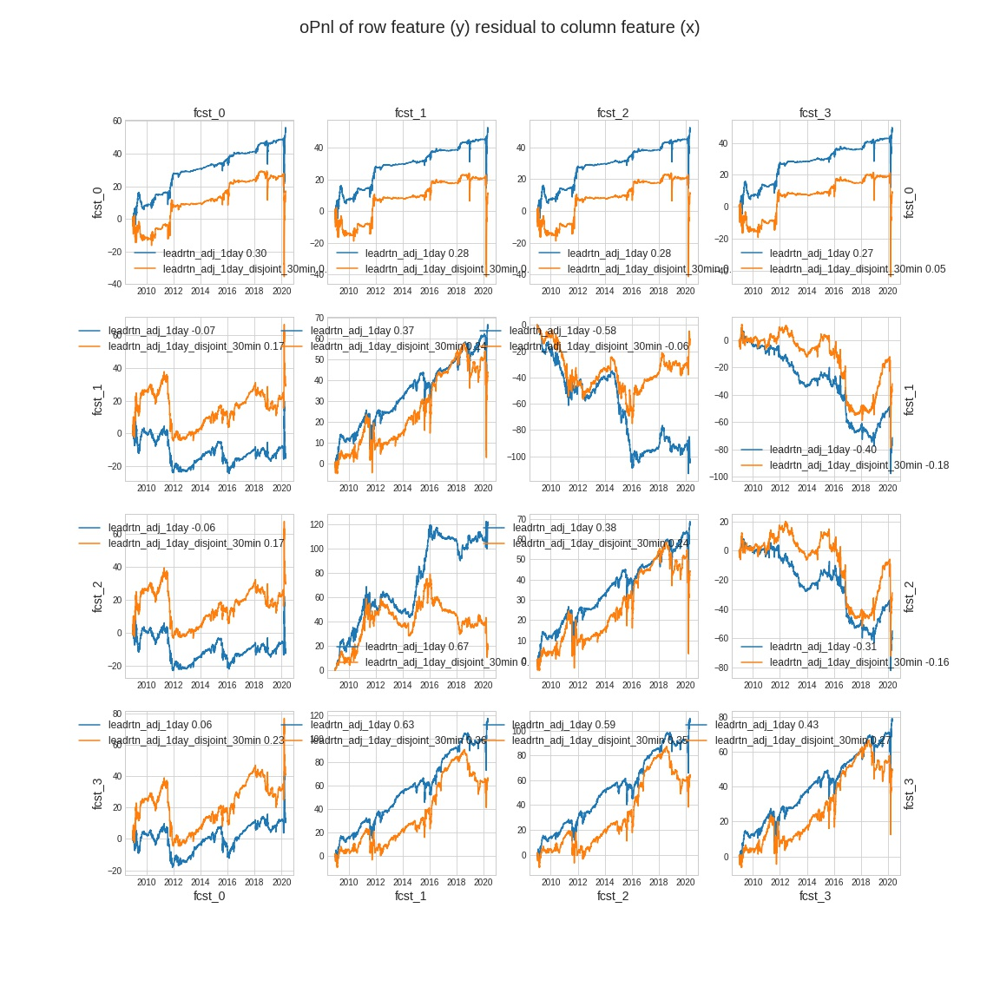

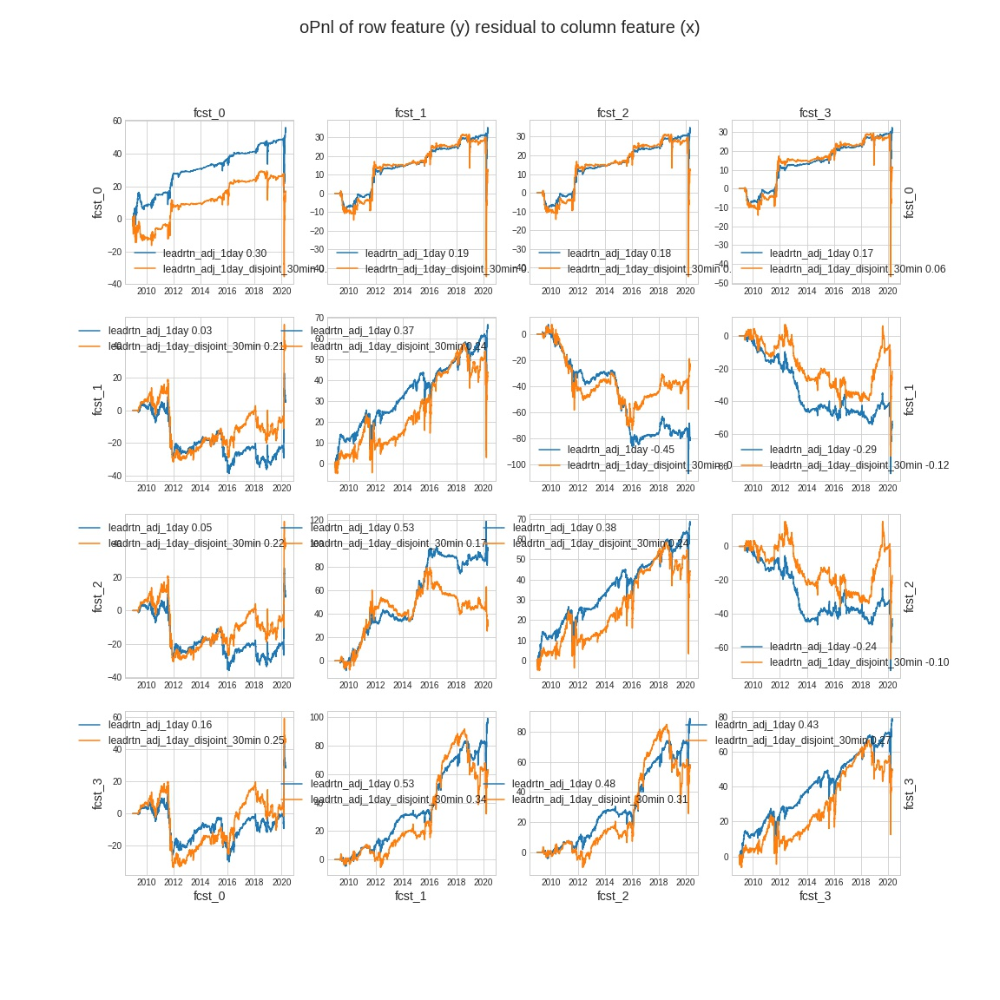

In [49]:
# Colossus_98060ed3a
############################################################################
BASELINE_NAME = 'Colossus_98060ed3a'
PREV_BASELINE = 'Colossus_7ddb133ff'
BASELINE_NOTES = 'The value of multplying omega into the weights W before the alpha stage'
if PREV_BASELINE and BASELINE_NOTES:
    BASELINE_NOTES += f' (follows {PREV_BASELINE}) '
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# set the input data
INTS_PER_DAY = 1
data = daily_data 

phps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end,  #
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=None, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
        winsorize_weight=None, #winsorizes the learning weight (not the regression weight)
        winsorize_orthos=None,
        normalize_orthos=True,
    ),        
    # hps related to profiling
    profiling=mx.HPSet(
        xsw=False,
        xsz=False,
        clip=None,
        exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_1day'],
        targets=['leadrtn_adj_1day', 'leadrtn_adj_1day_disjoint_30min' ],
        weight='valid_30min',
        
    ),
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min_13.rw_mean', 'log_open_unadj_30min', 'open_unadj_30min' ]
        + hps.feature_set.lagging_daily
        + hps.feature_set.vol
        + hps.feature_set.log_volumes_daily
        # + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.betas
        # + hps.feature_set.technical
        # + hps.feature_set.afacs                
    ) ),
    lookahead=2, #global lookahead
    targets=(
        []
        +['leadrtn_adj_1day'] 
    ),
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    weight='valid_30min',    
    colossus=mx.HPSet(
        minibatch=30,
        batch_size=2000,
        burn_in=2000,
        priming=200,        
        # defaults
        boost=1,
        loss='psr',
        kappa=2,
        halflife_kappa=None,
        halflife_polyak=30,
        tv=1,
        ortho=3,
        alphas=[
            mx.HPSet(
                mode='bilinear',
                rank=None,
                M=1,
                ar=10,
                ridge=1e-6,
                lr=1e-6,                        
                use_bias=True,
                transformer=mx.HPSet( hydra=False, ema_halflifes=[], post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) ),
            )
        ],
        alpha_transformer=mx.HPSet( winsorize=0.05, pre_normalize=mx.HPSet( halflife=100, clip=3 ), subset=None, transform=None ),        
        omega=mx.HPSet( lr=50.0, ridge=1e-2, shift=0.1, transformer=None ),
        gamma=None,
        theta=None, #mx.HPSet( lr=10, ridge=1e-3, shift=0.1 ),
        furiosa=None, #mx.HPSet( lr=1e-2, ridge=1, lr_min=0.01, lr_max=100,  ),
        zeta_transformer=mx.HPSet( winsorize=0.01, post_normalize=False ), #mx.HPSet( halflife=None, clip=3) ), 
    ),    
)

mxtr = mxtr.reload()
import madmax.furyroad as mxf; mxf = mxf.reload()
from research.etf_technical import furyroad_runner as refr; reload( refr )

# alphas = [
#     dict( transformer=phps.colossus.alphas[0].transformer.clone( hydra=True )  ),
#     dict( transformer=phps.colossus.alphas[0].transformer.clone( ema_halflifes=[2*INTS_PER_DAY, 5*INTS_PER_DAY, 20*INTS_PER_DAY])  ),
#     dict( lr=1e-8, transformer=phps.colossus.alphas[0].transformer.clone( hydra=True, ema_halflifes=[2*INTS_PER_DAY, 5*INTS_PER_DAY, 20*INTS_PER_DAY])  ),
# ]
# for a in alphas:
#     phps.colossus.alphas.append( phps.colossus.alphas[0].clone( **a ) )


# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline.hps == phps, 'failure to valdiate hyperparams'
        disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = refr.run_pipeline( data, hps=phps,  prev_baseline=PREV_BASELINE, memoize=True, verbose=True )
    disp( f'Expected {BASELINE_NAME}  got ', runner.name, h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        # let's give this fucker a name
        if not BASELINE_NAME: 
            BASELINE_NAME = runner.name 
        baseline = mx.Baseline.make( runner, hps=phps, notebook=Config.code,  notes=BASELINE_NOTES,  name=BASELINE_NAME   )
        disp( 'Baselined ', BASELINE_NAME, h=2, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( 'Regressions', reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )    
    
comparator = mx.ForecastComparator( targets=phps.profiling.targets, weight=phps.profiling.weight, winlen=100 )
_ = comparator.compare( baseline, forecasts=baseline.output_features[-4:] )



# Colossus_e9be30f83
## Baseline without gamma (follows Colossus_98060ed3a) 

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_1day,NaN,1688976,0.918845,9979.361568,1.318081,0.021461,0.000461,26.738337,2.272885,0.005696,0.019874,0.019555
leadrtn_adj_1day_disjoint_30min,NaN,1688976,0.918515,9979.361568,1.016737,0.008683,0.000075,10.835786,0.589789,0.005696,0.019874,0.019555


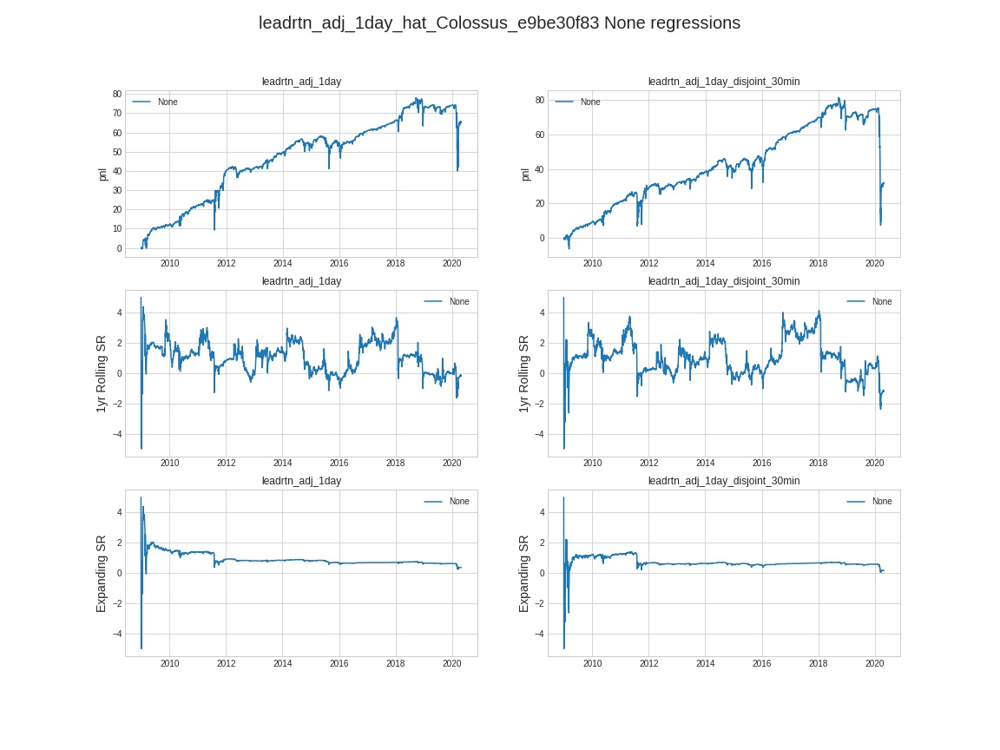

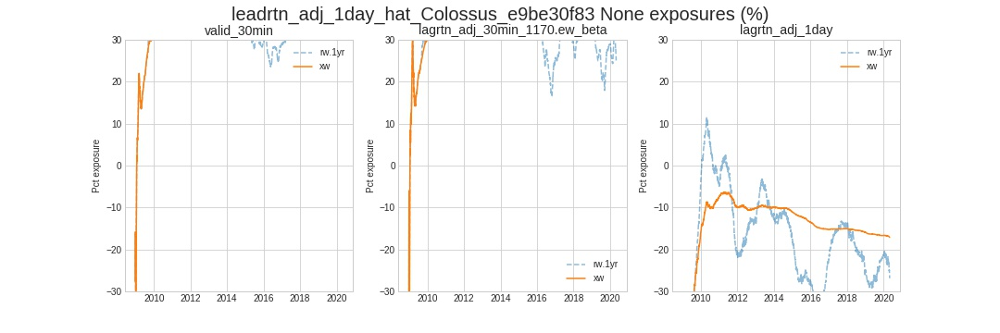

,0
leadrtn_adj_1day_hat_Colossus_c4157e1c5,fcst_0
leadrtn_adj_1day_hat_Colossus_31efaa3e3,fcst_1
leadrtn_adj_1day_hat_Colossus_7ddb133ff,fcst_2
leadrtn_adj_1day_hat_Colossus_98060ed3a,fcst_3
leadrtn_adj_1day_hat_Colossus_e9be30f83,fcst_4


,fcst_0,fcst_1,fcst_2,fcst_3,fcst_4
fcst_0,1.000000,0.458396,0.457332,0.467071,0.456581
fcst_1,0.458396,1.000000,0.998613,0.865225,0.340915
fcst_2,0.457332,0.998613,1.000000,0.864668,0.338144
fcst_3,0.467071,0.865225,0.864668,1.000000,0.367874
fcst_4,0.456581,0.340915,0.338144,0.367874,1.000000


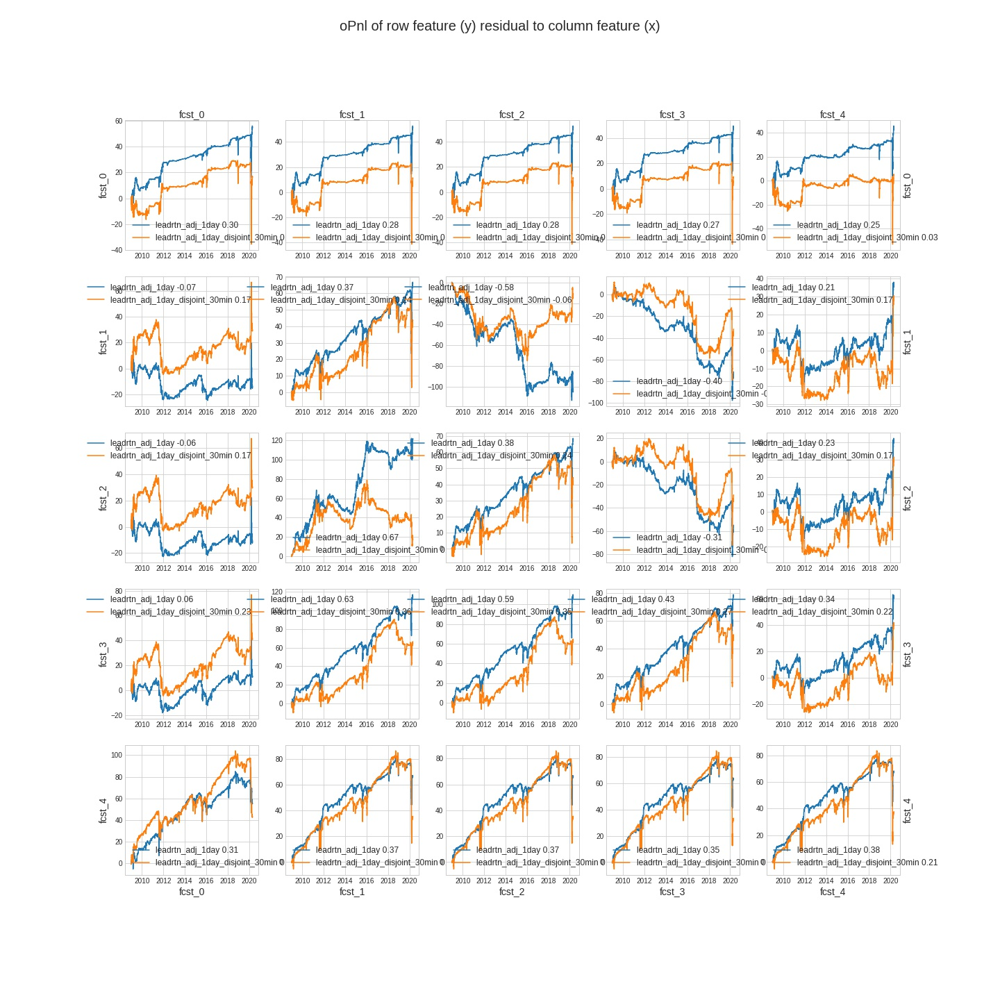

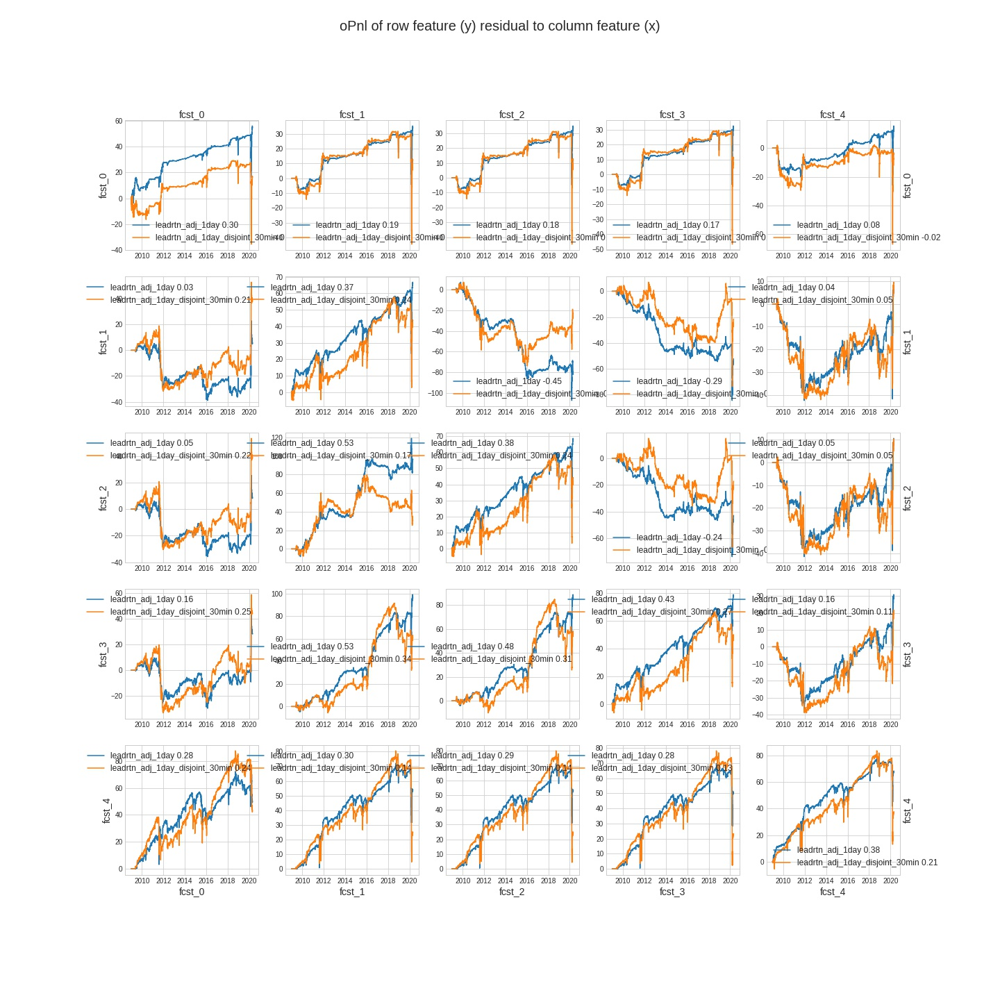

In [46]:
# Colossus_e9be30f83
############################################################################
BASELINE_NAME = 'Colossus_e9be30f83'
PREV_BASELINE = 'Colossus_98060ed3a'
BASELINE_NOTES = 'Baseline without gamma'
if PREV_BASELINE and BASELINE_NOTES:
    BASELINE_NOTES += f' (follows {PREV_BASELINE}) '
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# set the input data
INTS_PER_DAY = 1
data = daily_data 

phps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end,  #
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=None, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
        winsorize_weight=None, #winsorizes the learning weight (not the regression weight)
        winsorize_orthos=None,
        normalize_orthos=True,
        demean_conditioners=True,
        normalize_conditioners=True,
    ),        
    # hps related to profiling
    profiling=mx.HPSet(
        xsw=False,
        xsz=False,
        clip=None,
        exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_1day'],
        targets=['leadrtn_adj_1day', 'leadrtn_adj_1day_disjoint_30min' ],
        weight='valid_30min',
        
    ),
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min_13.rw_mean', 'log_open_unadj_30min', 'open_unadj_30min' ]
        + hps.feature_set.lagging_daily
        + hps.feature_set.vol
        + hps.feature_set.log_volumes_daily
        # + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.betas
        + hps.feature_set.technical
        #+ hps.feature_set.afacs                
    ) ),
    conditioners=sorted( set(
        [] 
        + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
    )),    
    lookahead=2, #global lookahead
    targets=(
        []
        +['leadrtn_adj_1day'] 
    ),
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    weight='valid_30min',    
    colossus=mx.HPSet(
        minibatch=20,
        batch_size=2000,
        burn_in=2000,
        priming=200,        
        # defaults
        boost=1,
        loss='psr',
        kappa=2,
        halflife_kappa=None,
        halflife_polyak=5,
        halflifes_adam=10,
        hyper_tune=None, #dict( polyak=dict( lr=1e8, decay=0.80, ridge=0, style='relu' ) ),
        tv=1,
        ortho=5,
        alpha=mx.HPSet(
            mode='bilinear', #with mean and avg-norm normalization
            rank=None,
            M=1,
            ar=10,
            ridge=1e-7,
            lr=1e-7,                        
            use_bias=True,
            halflifes_adam=10,
            halflife_polyak=None,
            ortho=5,
            transformer=mx.HPSet( winsorize=0.05, pre_normalize=mx.HPSet( halflife=100, clip=3 ), subset=None, transform=None, 
                                  hydra=False, ema_halflifes=None, #[2*INTS_PER_DAY, 5*INTS_PER_DAY, 20*INTS_PER_DAY], 
                                  post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) ),                
        ),
        omega=None, #mx.HPSet( lr=50.0, ridge=1e-2, shift=None, transformer=None ),
        gamma=None, #mx.HPSet( lr=10000, ridge=1e-9, use_bias=True, transformer=None, halflife_polyak=20, halflifes_adam=20 ),
        theta=None, #mx.HPSet( lr=10, ridge=1e-3, shift=0.1 ),
        zeta_transformer=mx.HPSet( winsorize=None, post_normalize=False ), #mx.HPSet( halflife=None, clip=3) ), 
    ),    
)

mxtr = mxtr.reload()
import madmax.furyroad as mxf; mxf = mxf.reload()
from research.etf_technical import furyroad_runner as refr; reload( refr )

# alphas = [
#     dict( transformer=phps.colossus.alphas[0].transformer.clone( hydra=True )  ),
#     dict( transformer=phps.colossus.alphas[0].transformer.clone( ema_halflifes=[2*INTS_PER_DAY, 5*INTS_PER_DAY, 20*INTS_PER_DAY])  ),
#     dict( lr=1e-8, transformer=phps.colossus.alphas[0].transformer.clone( hydra=True, ema_halflifes=[2*INTS_PER_DAY, 5*INTS_PER_DAY, 20*INTS_PER_DAY])  ),
# ]
# for a in alphas:
#     phps.colossus.alphas.append( phps.colossus.alphas[0].clone( **a ) )


# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline.hps == phps, 'failure to valdiate hyperparams'
        disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = refr.run_pipeline( data, hps=phps,  prev_baseline=PREV_BASELINE, memoize=True, verbose=True, dtype=tr.float64 )
    disp( f'Expected {BASELINE_NAME}  got ', runner.name, h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        # let's give this fucker a name
        if not BASELINE_NAME: 
            BASELINE_NAME = runner.name
        baseline = mx.Baseline.make( runner, hps=phps, notebook=Config.code,  notes=BASELINE_NOTES,  name=BASELINE_NAME   )
        disp( 'Baselined ', BASELINE_NAME, h=2, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( 'Regressions', reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )    
    
comparator = mx.ForecastComparator( targets=phps.profiling.targets, weight=phps.profiling.weight, winlen=100 )
_ = comparator.compare( baseline, forecasts=baseline.output_features[-5:] )



# Colossus_d0136c8b1
## Baseline with  gamma (follows Colossus_e9be30f83) 

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_1day,NaN,1688976,0.918845,9977.851833,1.345459,0.022587,0.00051,28.142279,2.415403,0.005678,0.019743,0.01928
leadrtn_adj_1day_disjoint_30min,NaN,1688976,0.918515,9977.851833,1.025314,0.008960,0.00008,11.167993,0.604385,0.005678,0.019743,0.01928


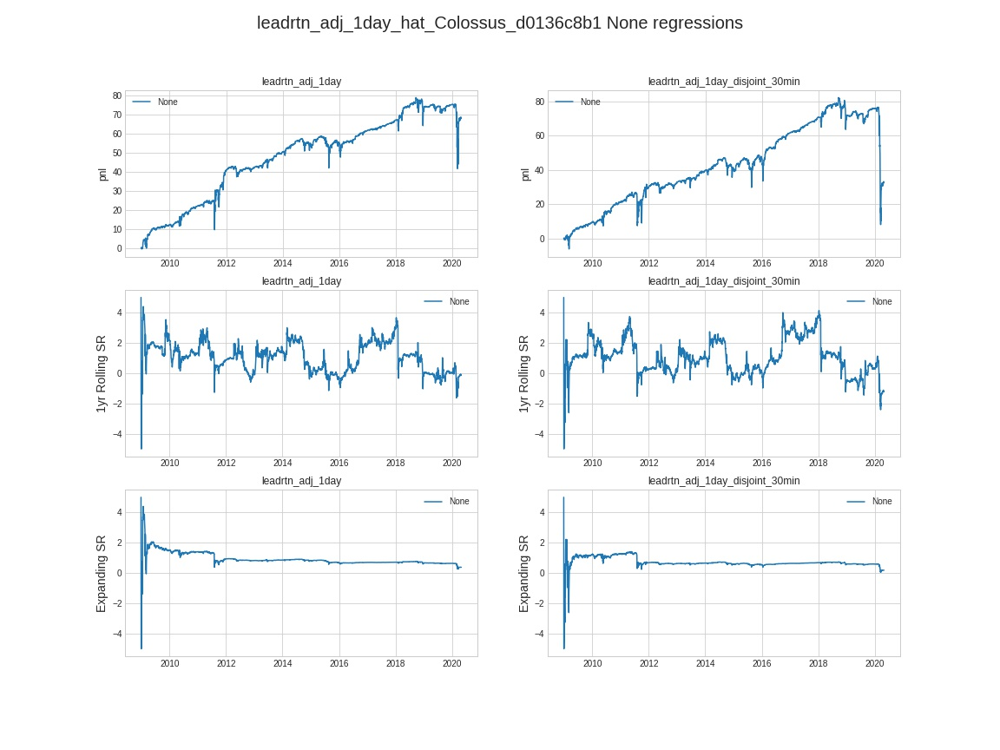

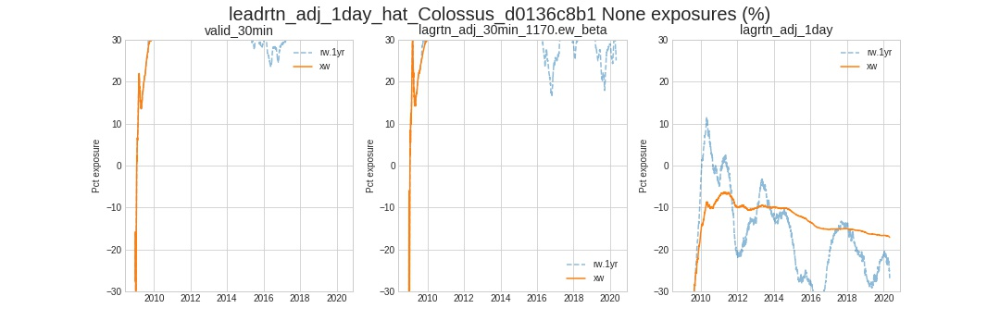

,0
leadrtn_adj_1day_hat_Colossus_31efaa3e3,fcst_0
leadrtn_adj_1day_hat_Colossus_7ddb133ff,fcst_1
leadrtn_adj_1day_hat_Colossus_98060ed3a,fcst_2
leadrtn_adj_1day_hat_Colossus_e9be30f83,fcst_3
leadrtn_adj_1day_hat_Colossus_d0136c8b1,fcst_4


,fcst_0,fcst_1,fcst_2,fcst_3,fcst_4
fcst_0,1.000000,0.998613,0.865225,0.340941,0.340811
fcst_1,0.998613,1.000000,0.864668,0.338171,0.338040
fcst_2,0.865225,0.864668,1.000000,0.367904,0.367803
fcst_3,0.340941,0.338171,0.367904,1.000000,0.999763
fcst_4,0.340811,0.338040,0.367803,0.999763,1.000000


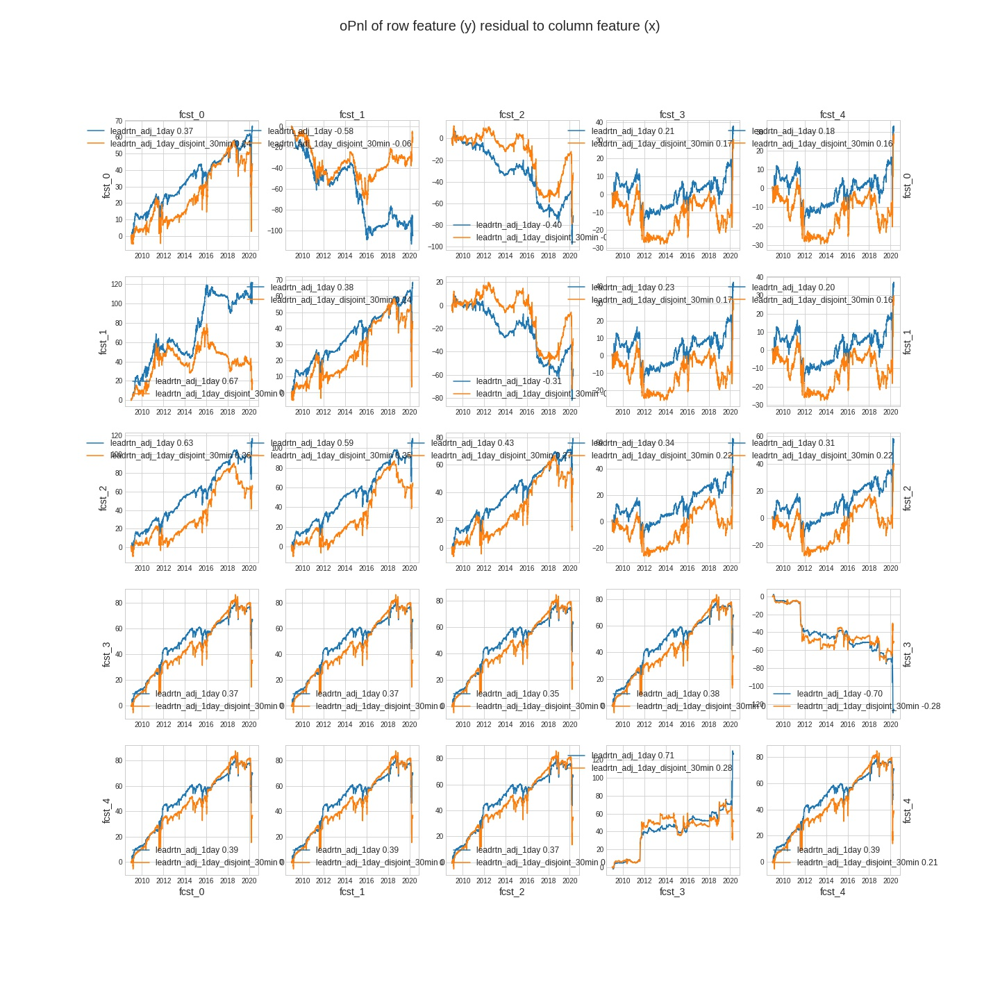

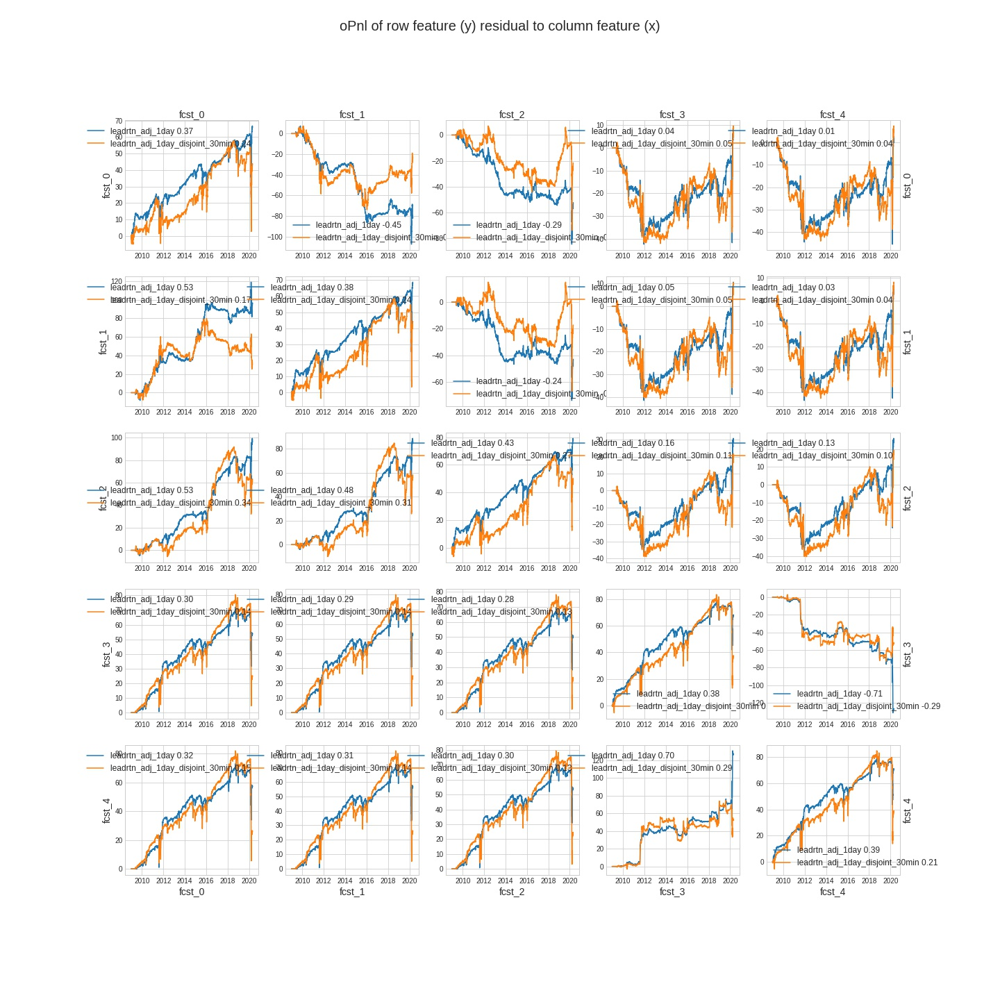

In [56]:
# Colossus_d0136c8b1
############################################################################
BASELINE_NAME = 'Colossus_d0136c8b1'
PREV_BASELINE = 'Colossus_e9be30f83'
BASELINE_NOTES = 'Baseline with  gamma'
if PREV_BASELINE and BASELINE_NOTES:
    BASELINE_NOTES += f' (follows {PREV_BASELINE}) '
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# set the input data
INTS_PER_DAY = 1
data = daily_data 

phps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end,  #
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=None, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
        winsorize_weight=None, #winsorizes the learning weight (not the regression weight)
        winsorize_orthos=None,
        normalize_orthos=True,
        demean_conditioners=True,
        normalize_conditioners=True,
    ),        
    # hps related to profiling
    profiling=mx.HPSet(
        xsw=False,
        xsz=False,
        clip=None,
        exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_1day'],
        targets=['leadrtn_adj_1day', 'leadrtn_adj_1day_disjoint_30min' ],
        weight='valid_30min',
        
    ),
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min_13.rw_mean', 'log_open_unadj_30min', 'open_unadj_30min' ]
        + hps.feature_set.lagging_daily
        + hps.feature_set.vol
        + hps.feature_set.log_volumes_daily
        # + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.betas
        + hps.feature_set.technical
        #+ hps.feature_set.afacs                
    ) ),
    conditioners=sorted( set(
        [] 
        + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
    )),    
    lookahead=2, #global lookahead
    targets=(
        []
        +['leadrtn_adj_1day'] 
    ),
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    weight='valid_30min',    
    colossus=mx.HPSet(
        end_to_end=False,
        minibatch=20,
        batch_size=2000,
        burn_in=2000,
        priming=200,        
        # defaults
        boost=1,
        loss='psr',
        kappa=2,
        halflife_kappa=None,
        halflife_polyak=5,
        halflifes_adam=10,
        hyper_tune=None, #dict( polyak=dict( lr=1e8, decay=0.80, ridge=0, style='relu' ) ),
        tv=1,
        ortho=5,
        alpha=mx.HPSet(
            mode='bilinear', #with mean and avg-norm normalization
            rank=None,
            M=1,
            ar=10,
            ridge=1e-7,
            lr=1e-7,                        
            use_bias=True,
            halflifes_adam=10,
            halflife_polyak=None,
            ortho=5,
            transformer=mx.HPSet( winsorize=0.05, pre_normalize=mx.HPSet( halflife=100, clip=3 ), subset=None, transform=None, 
                                  hydra=False, ema_halflifes=None, #[2*INTS_PER_DAY, 5*INTS_PER_DAY, 20*INTS_PER_DAY], 
                                  post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) ),                
        ),
        omega=None, #mx.HPSet( lr=50.0, ridge=1e-2, shift=None, transformer=None ),
        gamma=mx.HPSet( lr=10000, ridge=1e-9, use_bias=True, transformer=None, halflife_polyak=20, halflifes_adam=20 ),
        theta=None, #mx.HPSet( lr=10, ridge=1e-3, shift=0.1 ),
        zeta_transformer=mx.HPSet( winsorize=None, post_normalize=False ), #mx.HPSet( halflife=None, clip=3) ), 
    ),    
)

mxtr = mxtr.reload()
import madmax.furyroad as mxf; mxf = mxf.reload()
from research.etf_technical import furyroad_runner as refr; reload( refr )

# alphas = [
#     dict( transformer=phps.colossus.alphas[0].transformer.clone( hydra=True )  ),
#     dict( transformer=phps.colossus.alphas[0].transformer.clone( ema_halflifes=[2*INTS_PER_DAY, 5*INTS_PER_DAY, 20*INTS_PER_DAY])  ),
#     dict( lr=1e-8, transformer=phps.colossus.alphas[0].transformer.clone( hydra=True, ema_halflifes=[2*INTS_PER_DAY, 5*INTS_PER_DAY, 20*INTS_PER_DAY])  ),
# ]
# for a in alphas:
#     phps.colossus.alphas.append( phps.colossus.alphas[0].clone( **a ) )


# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline.hps == phps, 'failure to valdiate hyperparams'
        #disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = refr.run_pipeline( data, hps=phps,  prev_baseline=PREV_BASELINE, memoize=True, verbose=True, dtype=tr.float64 )
    disp( f'Expected {BASELINE_NAME}  got ', runner.name, h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        # let's give this fucker a name
        if not BASELINE_NAME: 
            BASELINE_NAME = runner.name
        baseline = mx.Baseline.make( runner, hps=phps, notebook=Config.code,  notes=BASELINE_NOTES,  name=BASELINE_NAME   )
        disp( 'Baselined ', BASELINE_NAME, h=2, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )    
    
comparator = mx.ForecastComparator( targets=phps.profiling.targets, weight=phps.profiling.weight, winlen=100 )
_ = comparator.compare( baseline, forecasts=baseline.output_features[-5:] )



# Colossus_b8588ea29
## Colossus with gamma, omega and chaining (follows Colossus_d0136c8b1) 

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_1day,NaN,1688976,0.918845,0.213615,1.116570,0.022680,0.000514,28.250521,3.417864,0.600864,0.601,0.54276
leadrtn_adj_1day_disjoint_30min,NaN,1688976,0.918515,0.213615,0.849518,0.012425,0.000154,15.496664,1.719510,0.600864,0.601,0.54276


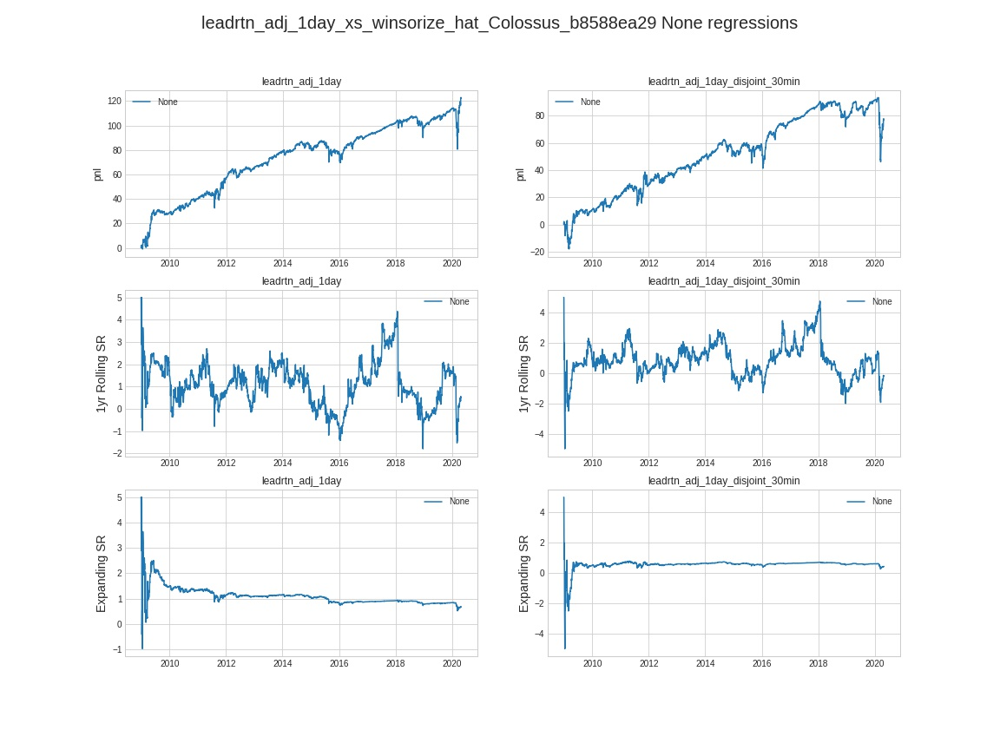

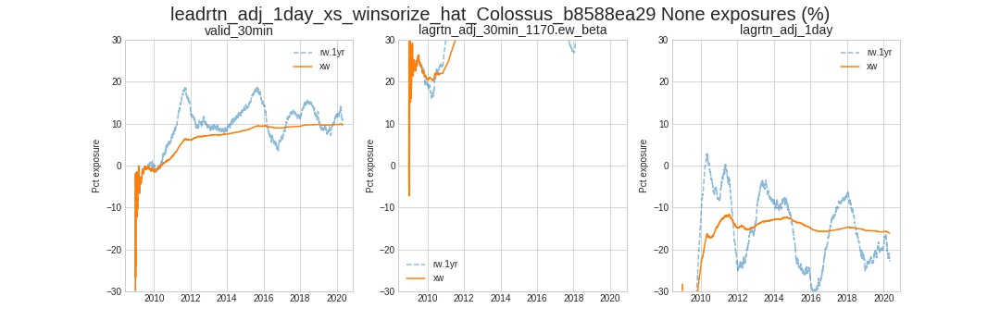

,0
leadrtn_adj_1day_hat_Colossus_7ddb133ff,fcst_0
leadrtn_adj_1day_hat_Colossus_98060ed3a,fcst_1
leadrtn_adj_1day_hat_Colossus_e9be30f83,fcst_2
leadrtn_adj_1day_hat_Colossus_d0136c8b1,fcst_3
leadrtn_adj_1day_xs_winsorize_hat_Colossus_b8588ea29,fcst_4


,fcst_0,fcst_1,fcst_2,fcst_3,fcst_4
fcst_0,1.000000,0.864668,0.338171,0.338064,0.563575
fcst_1,0.864668,1.000000,0.367904,0.367830,0.588541
fcst_2,0.338171,0.367904,1.000000,0.999688,0.451609
fcst_3,0.338064,0.367830,0.999688,1.000000,0.453175
fcst_4,0.563575,0.588541,0.451609,0.453175,1.000000


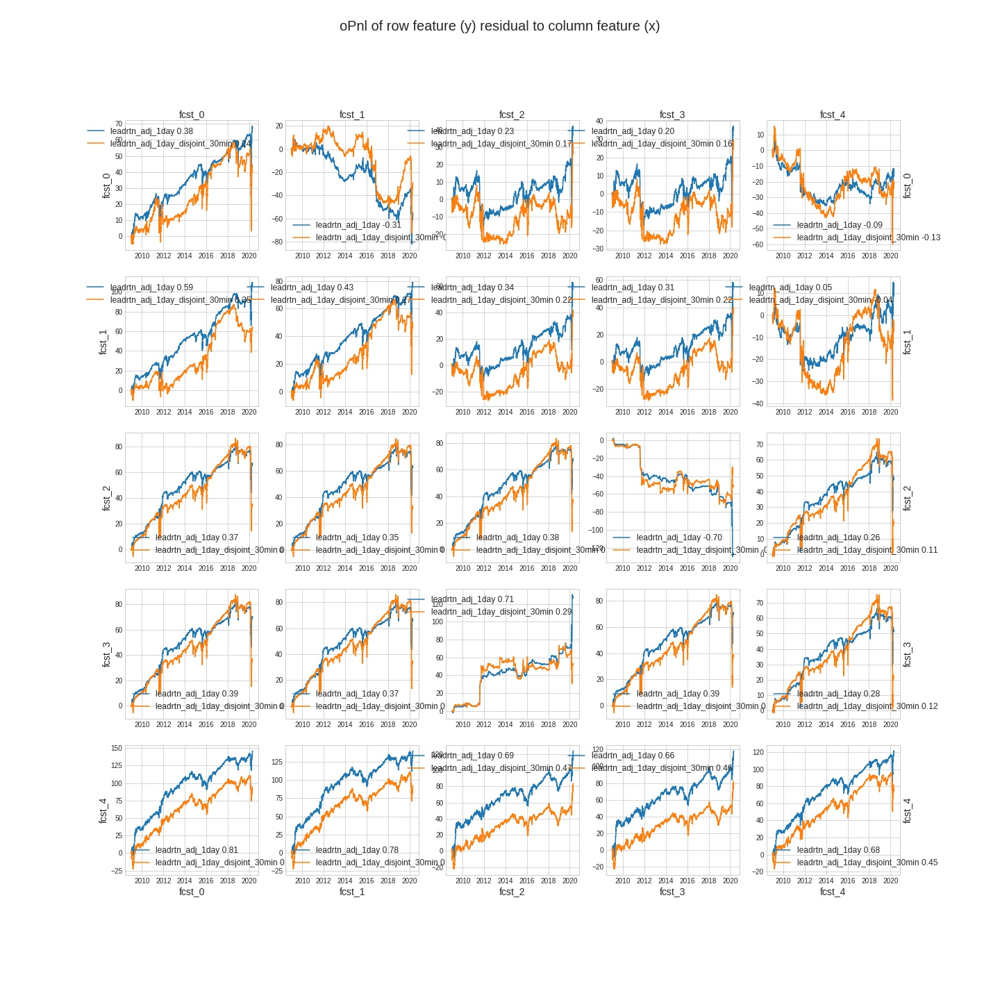

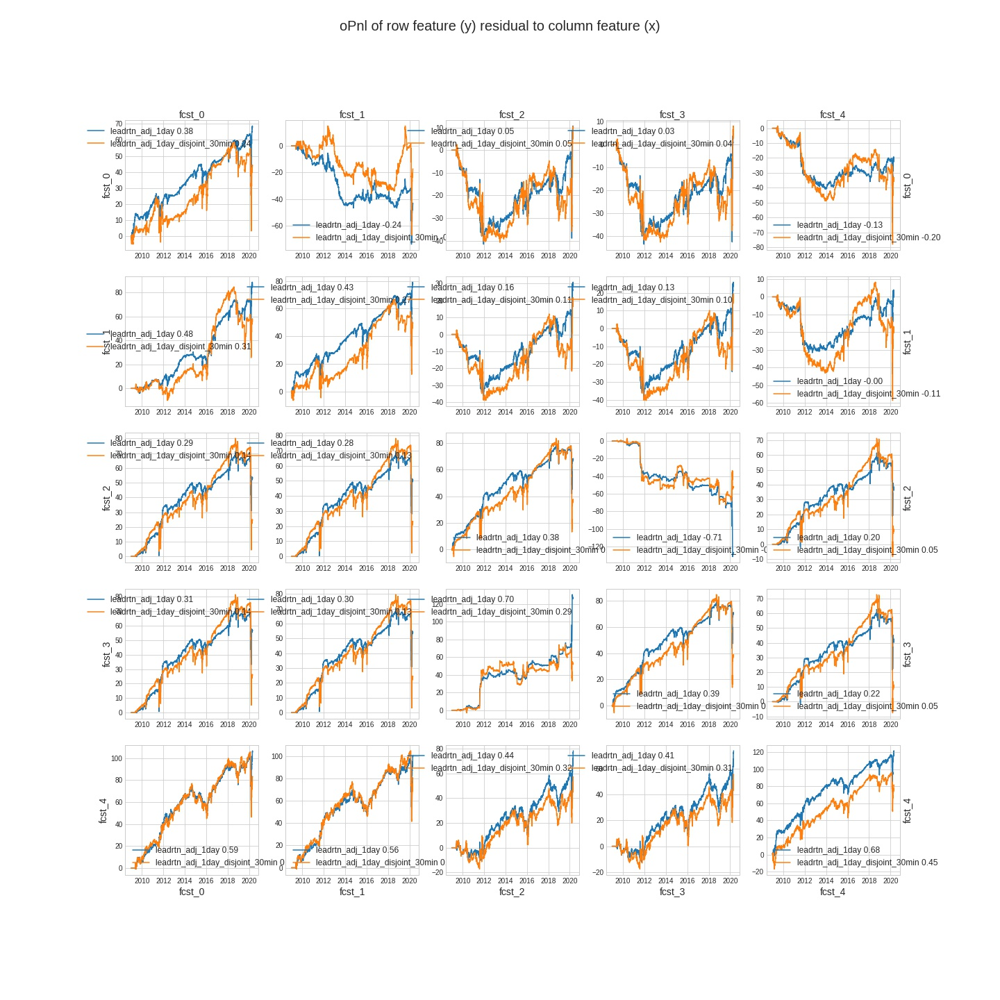

In [11]:
# Colossus_b8588ea29
############################################################################
BASELINE_NAME = 'Colossus_b8588ea29'
PREV_BASELINE = 'Colossus_d0136c8b1'
BASELINE_NOTES = 'Colossus with gamma, omega and chaining'
if PREV_BASELINE and BASELINE_NOTES:
    BASELINE_NOTES += f' (follows {PREV_BASELINE}) '
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# set the input data
INTS_PER_DAY = 1
data = daily_data 

phps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end,  #
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=0.01, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
        winsorize_weight=None, #winsorizes the learning weight (not the regression weight)
        winsorize_orthos=None,
        normalize_orthos=True,
        demean_conditioners=True,
        normalize_conditioners=True,
    ),        
    # hps related to profiling
    profiling=mx.HPSet(
        xsw=False,
        xsz=False,
        clip=None,
        exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_1day'],
        targets=['leadrtn_adj_1day', 'leadrtn_adj_1day_disjoint_30min' ],
        weight='valid_30min',
        
    ),
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min_13.rw_mean', 'log_open_unadj_30min', 'open_unadj_30min' ]
        + hps.feature_set.lagging_daily
        + hps.feature_set.vol
        + hps.feature_set.log_volumes_daily
        # + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.betas
        # + hps.feature_set.technical
        #+ hps.feature_set.afacs                
    ) ),
    conditioners=sorted( set(
        [] 
        + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
    )),    
    lookahead=2, #global lookahead
    targets=(
        []
        +['leadrtn_adj_1day'] 
    ),
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    weight='valid_30min',    
    colossus=mx.HPSet(
        end_to_end=True,
        minibatch=20,
        batch_size=2000,
        burn_in=2000,
        priming=200,        
        # defaults
        boost=1e-1,
        loss='psr',
        kappa=2,
        halflife_kappa=None,
        halflife_polyak=None,
        halflifes_adam=10,
        hyper_tune=None, #dict( hypergrad=dict( lr=1, decay=0.80, ridge=0, style='log' ) ),
        tv=None,
        ortho=5,
        alpha=mx.HPSet(
            mode='bilinear', #with mean and avg-norm normalization
            rank=None,
            M=1,
            ar=10,
            ridge=1e-7,
            lr=1e-7,                        
            use_bias=True,
            halflifes_adam=10,
            halflife_polyak=None,
            ortho=5,
            transformer=mx.HPSet( winsorize=0.05, pre_normalize=mx.HPSet( halflife=100, clip=3 ), subset=None, transform=None, 
                                  hydra=False, ema_halflifes=None, #[2*INTS_PER_DAY, 5*INTS_PER_DAY, 20*INTS_PER_DAY], 
                                  post_normalize=mx.HPSet( demean=False, normalize=True, halflife=None, clip=None) ),                
        ),
        omega=mx.HPSet( lr=1.0, ridge=1e-2, shift=None, transformer=None, halflife_polyak=20, act='softmax' ),
        gamma=mx.HPSet( lr=1.0, ridge=1e-9, use_bias=True, transformer=None, halflife_polyak=20, halflifes_adam=20 ),
        theta=None, #mx.HPSet( lr=1e-4, ridge=1e-3, shift=None, hyper_tune=None, act='softmax' ),
        zeta_transformer=mx.HPSet( winsorize=None, post_normalize=mx.HPSet( demean=True, normalize=True, halflife=None, clip=3) ), 
    ),    
)

mxtr = mxtr.reload()
import madmax.furyroad as mxf; mxf = mxf.reload()
from research.etf_technical import furyroad_runner as refr; reload( refr )
Config.start()

# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline.hps == phps, 'failure to valdiate hyperparams'
        #disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = refr.run_pipeline( data, hps=phps,  prev_baseline=PREV_BASELINE, memoize=True, verbose=True, dtype=tr.float64 )
    disp( f'Expected {BASELINE_NAME}  got ', runner.name, h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        # let's give this fucker a name
        if not BASELINE_NAME: 
            BASELINE_NAME = runner.name
        baseline = mx.Baseline.make( runner, hps=phps, notebook=Config.code,  notes=BASELINE_NOTES,  name=BASELINE_NAME   )
        disp( 'Baselined ', BASELINE_NAME, h=2, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )    
    
comparator = mx.ForecastComparator( targets=phps.profiling.targets, weight=phps.profiling.weight, winlen=100 )
_ = comparator.compare( baseline, forecasts=baseline.output_features[-5:] )

